# Sentiment Analysis & Text Classification of Amazon Mobile Reviews Data

In [6]:
#!pip install nltk
#!pip install wordcloud
#!pip install contractions
#import modin.pandas as pd

## Data Collection

#### Importing required libraries

In [5]:
import pandas as pd
import numpy as np
import warnings 
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import string
import spacy

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.util import ngrams

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud

import contractions
import unicodedata
import re

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from keras.models import Sequential
from keras.layers import Dense,Dropout,Activation
from keras.optimizers import SGD,Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import classification_report,precision_recall_curve,confusion_matrix,roc_auc_score
from sklearn.metrics import recall_score,accuracy_score

from langdetect import detect
from googletrans import Translator 
np.random.seed(0)

#### Reading data file

In [6]:
data=pd.read_json('Cell_Phones_and_Accessories_5.json',lines=True)

In [7]:
data.head(3)

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A30TL5EWN6DFXT,120401325X,christina,"[0, 0]",They look good and stick good! I just don't li...,4,Looks Good,1400630400,"05 21, 2014"
1,ASY55RVNIL0UD,120401325X,emily l.,"[0, 0]",These stickers work like the review says they ...,5,Really great product.,1389657600,"01 14, 2014"
2,A2TMXE2AFO7ONB,120401325X,Erica,"[0, 0]",These are awesome and make my phone look so st...,5,LOVE LOVE LOVE,1403740800,"06 26, 2014"


#### Reading Metadata file

In [8]:
meta_data=pd.read_json('meta_Cell_Phones_and_Accessories.json',lines=True)

In [9]:
meta_data.head(3)

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes
0,"[Cell Phones & Accessories, Accessories, Scree...",,[],,Trollies Sing a Long Party VHS,[],,,[],"557,379 in Movies & TV (",[],{'ASIN: ': '6303195164'},Movies & TV,,,,6303195164,[],[]
1,"[Cell Phones & Accessories, Accessories, Car A...",,[],,La Pura VHS,[],,Maribel Guardia,[],"1,024,449 in Movies & TV (",[],{'ASIN: ': '630524412X'},Movies & TV,,,,630524412X,[],[]
2,"[Cell Phones & Accessories, Cases, Holsters & ...",,"[New items to give you a new good mood, welcom...",,Leopard Thanksgiving Easter PC Black Case for ...,[],,,[],"5,315,017 in Books (",[],"{'Publisher:': 'juduiou', 'ASIN:': '6310200240...",Books,,,,6310200240,[],[]


In [10]:
data.shape

(194439, 9)

- Merging Product Data with necessary metadata

In [11]:
meta_data.columns

Index(['category', 'tech1', 'description', 'fit', 'title', 'also_buy', 'tech2',
       'brand', 'feature', 'rank', 'also_view', 'details', 'main_cat',
       'similar_item', 'date', 'price', 'asin', 'imageURL', 'imageURLHighRes'],
      dtype='object')

In [12]:
meta_data_selected=meta_data[['title','brand','asin']]
meta_data_selected.head()

,title,brand,asin
0,Trollies Sing a Long Party VHS,,6303195164
1,La Pura VHS,Maribel Guardia,630524412X
2,Leopard Thanksgiving Easter PC Black Case for ...,,6310200240
3,Puppies Faceplate Hard Case Protector for Net1...,Live2Pedal,6786501710
4,White Wolf Faceplate Protector Hard Case for S...,wirelessoutletusa,6786501273


In [9]:
#data.columns

Index(['reviewerID', 'asin', 'reviewerName', 'helpful', 'reviewText',
       'overall', 'summary', 'unixReviewTime', 'reviewTime'],
      dtype='object')

In [13]:
data=data[['reviewerID', 'asin', 'reviewText','overall', 'summary']]
data.head()

,reviewerID,asin,reviewText,overall,summary
0,A30TL5EWN6DFXT,120401325X,They look good and stick good! I just don't li...,4,Looks Good
1,ASY55RVNIL0UD,120401325X,These stickers work like the review says they ...,5,Really great product.
2,A2TMXE2AFO7ONB,120401325X,These are awesome and make my phone look so st...,5,LOVE LOVE LOVE
3,AWJ0WZQYMYFQ4,120401325X,Item arrived in great time and was in perfect ...,4,Cute!
4,ATX7CZYFXI1KW,120401325X,"awesome! stays on, and looks great. can be use...",5,leopard home button sticker for iphone 4s


#### Merging required columns from data and meta data

In [14]:
# Merge metadata_selected and data
final_data=pd.merge(left=data,right=meta_data_selected,how='left',on='asin')
final_data.head()
final_data.shape

(194516, 7)

In [15]:
final_data.drop_duplicates(subset=['reviewText'],inplace=True)
final_data.shape

(194186, 7)

In [142]:
final_data.isnull().sum()

reviewerID         0
asin               0
reviewText         0
overall            0
summary            0
title         106636
brand         106636
dtype: int64

- 'title' and 'brand' have missing values, but for text classification we do not need them and secondly, trying to impute these types of missing values would be equivalent to messing up with reality of data. Hence leaving them as it is.
- 'reviewText','summary','overall' are our columns of interest
- Here, 'overall' represents 'ratings'

In [17]:
final_data.head()

,reviewerID,asin,reviewText,overall,summary,title,brand
0,A30TL5EWN6DFXT,120401325X,They look good and stick good! I just don't li...,4,Looks Good,NaN,NaN
1,ASY55RVNIL0UD,120401325X,These stickers work like the review says they ...,5,Really great product.,NaN,NaN
2,A2TMXE2AFO7ONB,120401325X,These are awesome and make my phone look so st...,5,LOVE LOVE LOVE,NaN,NaN
3,AWJ0WZQYMYFQ4,120401325X,Item arrived in great time and was in perfect ...,4,Cute!,NaN,NaN
4,ATX7CZYFXI1KW,120401325X,"awesome! stays on, and looks great. can be use...",5,leopard home button sticker for iphone 4s,NaN,NaN


- In the below step, we merge reviewText and Summary as both in combination can help in better understanding the review

In [18]:
final_data['summary']=final_data['summary'].apply(lambda x:x+' ')
final_data['reviewText']=final_data['summary']+final_data['reviewText']
final_data.head()

,reviewerID,asin,reviewText,overall,summary,title,brand
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN
2,A2TMXE2AFO7ONB,120401325X,LOVE LOVE LOVE These are awesome and make my p...,5,LOVE LOVE LOVE,NaN,NaN
3,AWJ0WZQYMYFQ4,120401325X,Cute! Item arrived in great time and was in pe...,4,Cute!,NaN,NaN
4,ATX7CZYFXI1KW,120401325X,leopard home button sticker for iphone 4s awes...,5,leopard home button sticker for iphone 4s,NaN,NaN


## Data Exploration, Visualization, Processing

### Exploratory Data Analysis - 1

In [19]:
rating_count=data['overall'].value_counts().reset_index().rename({'index':'rating','overall':'count'},axis='columns')
rating_count

,rating,count
0,5,108664
1,4,39993
2,3,21439
3,1,13279
4,2,11064


#### Visualizing Distrubution of Rating

In [20]:
fig=px.bar(rating_count,x='rating',y='count',
          labels=dict(rating='Rating',count='Number of Ratings'))
fig.show()

#### Visualizing Overall Review Length

In [21]:
final_data['review_length']=final_data['reviewText'].apply(lambda x:len(x.split()))
fig=px.histogram(final_data['review_length'],title='Review Length Distribution')
fig.show()

### Dropping outliers / abnormal reviews

In [22]:
final_data[(final_data['reviewerID']=='A33OR4GZ08RRMW') & (final_data['asin']=='B002D4IHYM')]

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length
10627,A33OR4GZ08RRMW,B002D4IHYM,&#1593;&#1580;&#1610;&#1576; &#1576;&#1589;&#1...,5,&#1593;&#1580;&#1610;&#1576;,New Trent Easypak 7000mAh Portable Triple USB ...,New Trent,38


In [23]:
final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B0033WSDV0')]

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length
14347,A38N0O4TIZE4FJ,B0033WSDV0,&#1605;&#1605;&#1578;&#1575;&#1586; &#1575;&#1...,4,&#1605;&#1605;&#1578;&#1575;&#1586;,NaN,NaN,54


### Dropping all such records

In [24]:
final_data.drop(final_data[(final_data['reviewerID']=='A33OR4GZ08RRMW') & (final_data['asin']=='B002D4IHYM')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B0033WSDV0')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A1LL1D30P9D7PG') & (final_data['asin']=='B007406HOC')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A1LL1D30P9D7PG') & (final_data['asin']=='B007404WKI')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A2IRRWHFG96C18') & (final_data['asin']=='B0073YC5ZE')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B00757ERD2')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B0092QSQEK')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B00993E7PI')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B009GCA9AY')].index,inplace=True)
final_data.drop(final_data[(final_data['reviewerID']=='A38N0O4TIZE4FJ') & (final_data['asin']=='B00ADH7242')].index,inplace=True)


### Data Processing : Text Cleaning

- Dimension Reduction is occuring during following steps of NLP:
 1. Removing Non-Ascii characters
 2. Removiing stopwords
 3. Lemmatization using POS tagging
 4. Removing digits as they don't serve any purpose for our review prediction

In [25]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [26]:
# Step 1: Expand Contractions
def expand_contractions(x):
    try:
        text=[contractions.fix(token) for token in x.split()]
        text=' '.join(text)
        return text
    except:
        return np.nan
    
# Step 2: Removing non-ascii characters (like emojis) and converting text into lower case
def remove_non_ascii(x):
    try:
        text=unicodedata.normalize('NFKD',x).encode('ascii', 'ignore').decode('utf-8', 'ignore')  
        text=text.lower()
        text=text.split()
        text=' '.join(text)
        return text
    except:
        return np.nan
    
# Step 3: Remove Punctuations
def remove_punctuation(x):
    try:
        #x=re.sub('\d+','',x)
        text=[token for token in x if token not in string.punctuation]
        text=''.join(text)
        return text
    except:
        return np.nan
    
# Step 4: Remove Stopwords and digits

stopwords_list=stopwords.words('english')


def remove_stopwords(x):
    try:
        text=[token for token in x.split() if token.lower() not in stopwords_list]
        text=' '.join(text)
        return text

    except:
        return np.nan
    
# NLTK has a set of stopwords in English lanuage. We check for these stopwords in our review, and remove them. 
# stopwords_list has a list of all stopwords of english language as defined in nltk.
# In order to retain negative words like no, not for classification of Negative Reviews, we remove these words from stopwords_list.

#stopwords_list.remove('no')
#stopwords_list.remove('not')
stopwords_list_negative=stopwords.words('english')
stopwords_list_negative.remove('no')
stopwords_list_negative.remove('not')  
def remove_stopwords_retain_negative(x):
    try:
        text=[token for token in x.split() if token.lower() not in stopwords_list_negative]
        text=' '.join(text)
        return text

    except:
        return np.nan
    
# Step 5: Selecting only Verbs, Adverbs and Adjectives for our Analysis
def selective_POS_tagging(x):
    try:
        tagged=nltk.pos_tag(x.split())
        # J=adjective, V=verb, R=adverb
        text=[word for word,tag in tagged if not tag.startswith('N')]
        text=' '.join(text)
        return text
#tag.startswith('J') or tag.startswith('V') or tag.startswith('R') or
    except:
        return np.nan
#print [(word, tag) for word, tag in tagged if tag in ('NN', 'VB')]
    
# This function returns POS tag which can be passed to lemmatize(...,pos=)
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

# Step 5: Perform Lemmatization
def lemmatize(x):
    try:
        lemmatized_text=[]
        text=x.split()
        words_and_tags=nltk.pos_tag(text)
        #print(words_and_tags)
        lemmatizer=WordNetLemmatizer()
        for token, tag in words_and_tags:
            lemma=lemmatizer.lemmatize(word=token,pos=get_wordnet_pos(tag))
            lemmatized_text.append(lemma)
        lemmatized_text=' '.join(lemmatized_text)
        return lemmatized_text 
    except:
        np.nan

In [27]:
# Before passing our review to text translation code, we need to expand contractions, remove non-ascii characters(emojis) and remove punctuations
final_data['partially_cleaned_reviewText']=final_data['reviewText'].apply(lambda x:expand_contractions(x))
final_data['partially_cleaned_reviewText']=final_data['partially_cleaned_reviewText'].apply(lambda x:remove_non_ascii(x))
final_data['partially_cleaned_reviewText']=final_data['partially_cleaned_reviewText'].apply(lambda x:remove_punctuation(x))


In [28]:
final_data.head(2)

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN,39,looks good they look good and stick good i jus...
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN,35,really great product these stickers work like ...


### Language Translation

In [34]:
#simple function to detect and translate text 
def detect_and_translate(text,target_lang):
    
    result_lang = detect(text)
    #print('Before Translation: \n')
    #print(result_lang+str(':')+text)
    try:
        if result_lang == target_lang:
            return text 
    
        else:
            
            translator = Translator()
            translate_text = translator.translate(text,src=result_lang,dest=target_lang)
            #print("\nAfter Translating into English: ")
            return translate_text.text 
    except:
        return np.nan


In [30]:
final_data[(final_data['reviewerID']=='A2E6EQZYF2XF93') & (final_data['asin']=='B0035R2QS4')]

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText
14631,A2E6EQZYF2XF93,B0035R2QS4,Bueno El producto cumple mis aspiraciones y es...,4,Bueno,NaN,NaN,22,bueno el producto cumple mis aspiraciones y es...


In [31]:
spanish_review=final_data[(final_data['reviewerID']=='A2E6EQZYF2XF93') & (final_data['asin']=='B0035R2QS4')]['partially_cleaned_reviewText'].item()

In [32]:
detect_and_translate(spanish_review,target_lang='en')

Before Translation: 

es:bueno el producto cumple mis aspiraciones y esta bien con el precio que tiene me gusto y lo recomendariacutea a mis amigos

After Translating into English: 


'Well the product meets my aspirations and it is fine with the price I like and recommend it to my friends'

In [33]:
final_data['partially_cleaned_reviewText'].isnull().sum()

0

In [35]:
%%time
final_data['translated_text']=final_data['partially_cleaned_reviewText'].apply(detect_and_translate,target_lang='en')

Wall time: 12min 24s


In [36]:
final_data['translated_text'].isnull().sum()

0

In [37]:
final_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\Translated_Reviews.csv')

In [ ]:
#final_data=pd.read_csv(r'Translated_Reviews.csv')

#### Text Cleaning of a Sample Review

In [38]:
print('Review Before Text Cleaning: \n')
rev=" This phone case looks great!!😍 I just don't like the rounded shape, Siri kept popping up and it was irritating. I just won't buy a product like this again"
print(rev)
print("\n")
op=expand_contractions(rev)
print("After Removing Expand Contractions :\n",op)
print("\n")
op=remove_non_ascii(op)
print("After Removing Non-ASCII Characters: \n",op)
print("\n")
op=remove_punctuation(op)
print("After Removing Punctuations: \n",op)
print("\n")
op=remove_stopwords_retain_negative(op)
print("After Removing Stopwords : \n",op)
print("\n")
op=selective_POS_tagging(op)
print("After Selective POS Tagging & Lemmatization: \n",op)
op=lemmatize(op)
print('\n')
print('Review After Text Cleaning i.e. removing punctuations, emojis, stopwords,expanding contractions,lemmatization and so on: \n')
print(op)

Review Before Text Cleaning: 

 This phone case looks great!!😍 I just don't like the rounded shape, Siri kept popping up and it was irritating. I just won't buy a product like this again


After Removing Expand Contractions :
 This phone case looks great!!😍 I just do not like the rounded shape, Siri kept popping up and it was irritating. I just will not buy a product like this again


After Removing Non-ASCII Characters: 
 this phone case looks great!! i just do not like the rounded shape, siri kept popping up and it was irritating. i just will not buy a product like this again


After Removing Punctuations: 
 this phone case looks great i just do not like the rounded shape siri kept popping up and it was irritating i just will not buy a product like this again


After Removing Stopwords : 
 phone case looks great not like rounded shape siri kept popping irritating not buy product like


After Selective POS Tagging & Lemmatization: 
 looks great not like rounded kept popping irritating

In [39]:
def text_cleaning(final_data):
    #%%time
    final_data['cleaned_reviewText']=final_data['translated_text'].apply(expand_contractions)
    final_data['cleaned_reviewText']=final_data['cleaned_reviewText'].apply(remove_non_ascii)
    final_data['cleaned_reviewText']=final_data['cleaned_reviewText'].apply(remove_punctuation)
    final_data['cleaned_reviewText']=final_data['cleaned_reviewText'].apply(remove_stopwords_retain_negative)
    final_data['cleaned_reviewText']=final_data['cleaned_reviewText'].apply(selective_POS_tagging)
    ### Lemmatization
    #%%time
    final_data['cleaned_reviewText']=final_data['cleaned_reviewText'].apply(lemmatize)
    return final_data

#### Applying Text Cleaning to All the Reviews of Dataset

In [40]:
%%time
final_data=text_cleaning(final_data)

Wall time: 15min 42s


In [41]:
final_data['lemmatized_review_length']=final_data['cleaned_reviewText'].apply(lambda x:len(x.split()))

In [42]:
final_data.head(2)

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN,39,looks good they look good and stick good i jus...,looks good they look good and stick good i jus...,good good good not like round always bump keep...,14
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN,35,really great product these stickers work like ...,really great product these stickers work like ...,really great work like say stick great stylish,8


In [43]:
final_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\translated_cleaned_data.csv')

In [44]:
final_data['cleaned_reviewText'].isnull().sum()

0

In [46]:
#final_data=pd.read_csv('translated_cleaned_data.csv')
final_data.head()

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN,39,looks good they look good and stick good i jus...,looks good they look good and stick good i jus...,good good good not like round always bump keep...,14
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN,35,really great product these stickers work like ...,really great product these stickers work like ...,really great work like say stick great stylish,8
2,A2TMXE2AFO7ONB,120401325X,LOVE LOVE LOVE These are awesome and make my p...,5,LOVE LOVE LOVE,NaN,NaN,37,love love love these are awesome and make my p...,love love love these are awesome and make my p...,love awesome make use one far almost believe o...,10
3,AWJ0WZQYMYFQ4,120401325X,Cute! Item arrived in great time and was in pe...,4,Cute!,NaN,NaN,52,cute item arrived in great time and was in per...,cute item arrived in great time and was in per...,cute arrive great perfect however order great ...,21
4,ATX7CZYFXI1KW,120401325X,leopard home button sticker for iphone 4s awes...,5,leopard home button sticker for iphone 4s,NaN,NaN,30,leopard home button sticker for iphone 4s awes...,leopard home button sticker for iphone 4s awes...,leopard 4 awesome look great use especially he...,9


### Exploratory Data Analysis - 2

#### Split the data depending on ratings for further analysis

In [47]:
# High rating data will have reviews with rating 4 or 5
high_rating=final_data[(final_data['overall']==4) | (final_data['overall']==5)]

# Medium rating will have reviews with rating 3
medium_rating=final_data[final_data['overall']==3]

# Low rating will have reviews with rating 1,2
low_rating=final_data[(final_data['overall']==1) | (final_data['overall']==2)]

In [48]:
high_rating.head(2)

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN,39,looks good they look good and stick good i jus...,looks good they look good and stick good i jus...,good good good not like round always bump keep...,14
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN,35,really great product these stickers work like ...,really great product these stickers work like ...,really great work like say stick great stylish,8


In [49]:
def plot_review_length_histogram(df,string):
    fig=make_subplots(rows=1,cols=2)
    trace_11=go.Histogram(x=df['review_length'],nbinsx=20)

    trace_12=go.Histogram(x=df['lemmatized_review_length'],nbinsx=20)
    fig.append_trace(trace_11, 1, 1)
    fig.append_trace(trace_12, 1, 2)

    
    fig.update_layout( height=600, width=1000,title_text='Review Length Before and After Lemmatization'+string)
    fig.show()

####  Review Length for High Rated products (Rating = 4,5)

In [50]:
plot_review_length_histogram(high_rating," for ratings:4,5")

####  Review Length for Medium Rated products (Rating = 3)

In [51]:
plot_review_length_histogram(medium_rating," for ratings:3")

####  Review Length for Low Rated products (Rating = 1,2)

In [52]:
plot_review_length_histogram(low_rating," for ratings:1,2")

In [53]:
high_rating.describe().loc['mean'].reset_index()[1:].rename({'index':'Feature','mean':'Mean'},axis='columns')

,Feature,Mean
1,review_length,96.072300
2,lemmatized_review_length,29.529291


In [54]:
medium_rating.describe().loc['mean'].reset_index()[1:].rename({'index':'Feature','mean':'Mean'},axis='columns')

,Feature,Mean
1,review_length,100.805255
2,lemmatized_review_length,31.124090


In [56]:
high=high_rating.describe().loc['mean'].reset_index()[1:].rename({'index':'Feature','mean':'Mean'},axis='columns')
medium=medium_rating.describe().loc['mean'].reset_index()[1:].rename({'index':'Feature','mean':'Mean'},axis='columns')
low=low_rating.describe().loc['mean'].reset_index()[1:].rename({'index':'Feature','mean':'Mean'},axis='columns')

In [58]:
mean_review_length=pd.concat([high,low,medium],axis=0)
mean_review_length['Rating Type']=['High','High','Medium','Medium','Low','Low']
mean_review_length

,Feature,Mean,Rating Type
1,review_length,96.072300,High
2,lemmatized_review_length,29.529291,High
1,review_length,90.680617,Medium
2,lemmatized_review_length,28.933320,Medium
1,review_length,100.805255,Low
2,lemmatized_review_length,31.124090,Low


In [59]:
fig=px.bar(mean_review_length,x='Rating Type',y='Mean',
           color='Feature',barmode='group',
          labels=dict(Mean='Mean Review Length'))
fig.show()

### n-grams Analysis

In [60]:
def get_ngrams(corpus,n):
    corpus=corpus.tolist()
    corpus=' '.join(corpus)
    corpus=corpus.split()
    #print(corpus[:5])
    n_grams=ngrams(corpus,n)
    return pd.Series(n_grams)

#### Bi-gram Analysis of High, Medium, Low Rated Reviews

In [61]:
# Creating Bi-grams for High Rated Reviews
bi_grams_high=get_ngrams(high_rating['cleaned_reviewText'],2)
bi_grams_high=pd.DataFrame(pd.Series(bi_grams_high).value_counts().reset_index())
bi_grams_high.rename(columns={'index':'bi-grams',0:'count'},inplace=True)
bi_grams_high.head()

,bi-grams,count
0,"(work, great)",8435
1,"(work, well)",6344
2,"(great, great)",5702
3,"(highly, recommend)",5511
4,"(would, recommend)",5482


In [62]:
# Creating Bi-grams for Medium Rated Reveiws
bi_grams_medium=get_ngrams(medium_rating['cleaned_reviewText'],2)
bi_grams_medium=pd.DataFrame(pd.Series(bi_grams_medium).value_counts().reset_index())
bi_grams_medium.rename(columns={'index':'bi-grams',0:'count'},inplace=True)
bi_grams_medium.head()

,bi-grams,count
0,"(would, not)",1487
1,"(not, work)",1138
2,"(not, like)",1132
3,"(not, fit)",1130
4,"(good, not)",1088


In [63]:
#Creating Bi-grams for Low Rated Reviews
bi_grams_low=get_ngrams(low_rating['cleaned_reviewText'],2)
bi_grams_low=pd.DataFrame(pd.Series(bi_grams_low).value_counts().reset_index())
bi_grams_low.rename(columns={'index':'bi-grams',0:'count'},inplace=True)
bi_grams_high['bi-grams']=bi_grams_high['bi-grams'].tolist()
bi_grams_low.head()

,bi-grams,count
0,"(would, not)",3041
1,"(not, work)",2965
2,"(not, fit)",2439
3,"(not, buy)",2065
4,"(not, even)",1478


In [64]:
#bi_grams_high['bi-grams']=bi_grams_high['bi-grams'].tolist()
#bi_grams_high[:10]

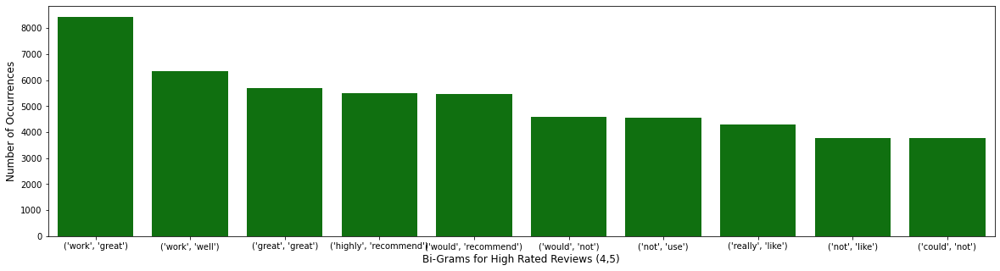

In [65]:
plt.figure(figsize=(20,5))
sns.barplot(x='bi-grams',y='count',data=bi_grams_high[:10],color='g')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Bi-Grams for High Rated Reviews (4,5)', fontsize=12)
plt.show()

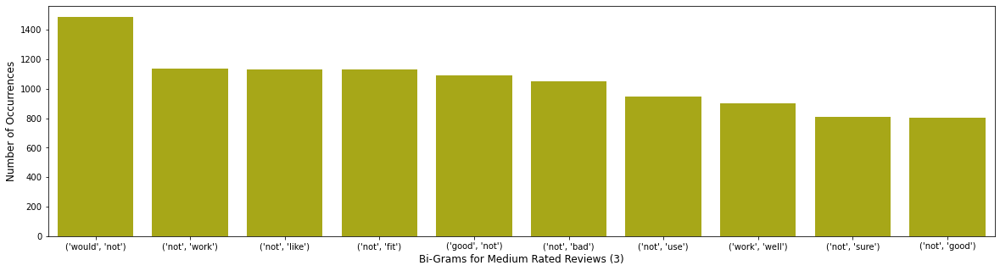

In [66]:
plt.figure(figsize=(20,5))
sns.barplot(x='bi-grams',y='count',data=bi_grams_medium[:10],color='y')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Bi-Grams for Medium Rated Reviews (3)', fontsize=12)
plt.show()

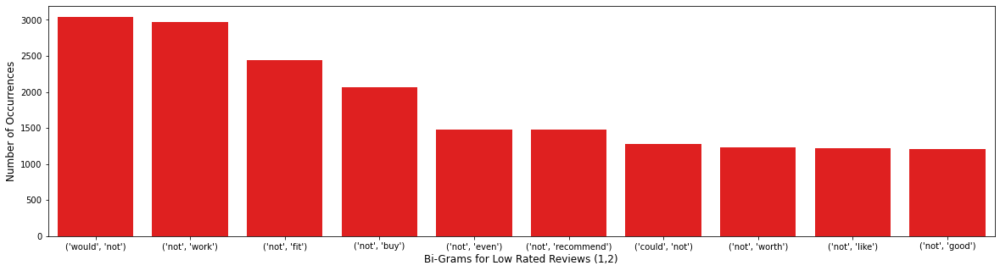

In [67]:
plt.figure(figsize=(20,5))
sns.barplot(x='bi-grams',y='count',data=bi_grams_low[:10],color='r')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Bi-Grams for Low Rated Reviews (1,2)', fontsize=12)
plt.show()
#	rgb(255, 0, 0)

In [219]:
#bi_grams_low.head(15)

#### Plotting a word cloud for each type of rating

In [68]:
good_reviews=high_rating['cleaned_reviewText'].tolist()
good_reviews_string=' '.join(good_reviews)
#good_reviews_string=' '.join(good_reviews.split())

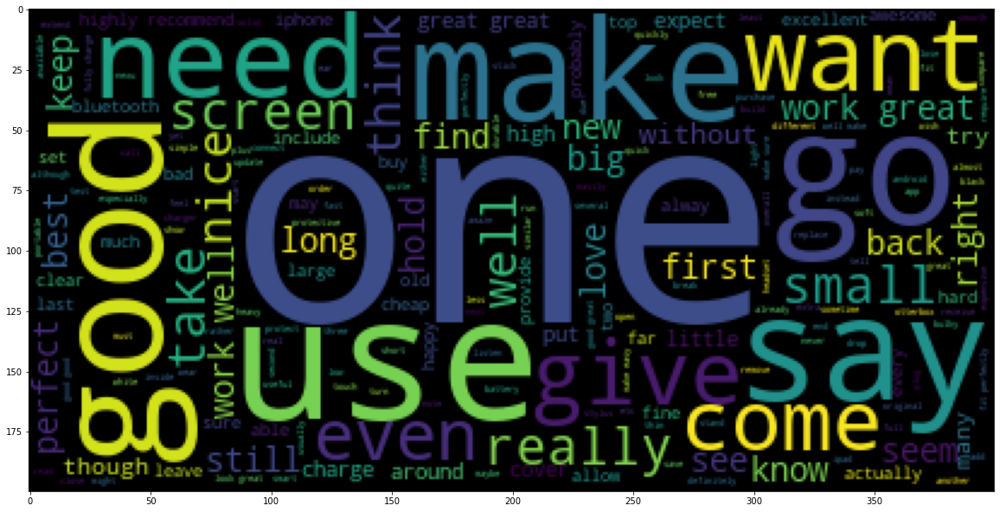

In [69]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(good_reviews_string))

In [70]:
medium_reviews=medium_rating['cleaned_reviewText'].tolist()
medium_reviews_string=' '.join(medium_reviews)

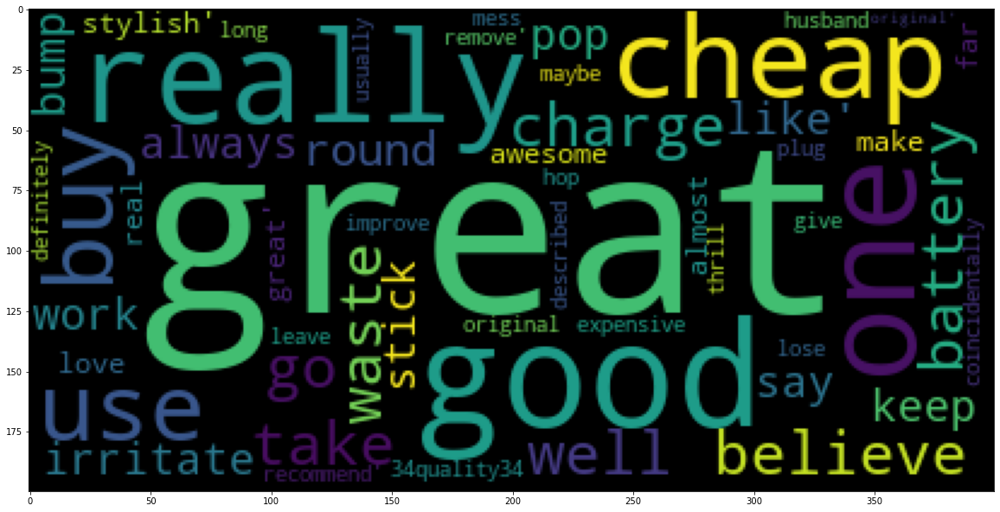

In [71]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(str(final_data['cleaned_reviewText'].values)))

In [72]:
bad_reviews=low_rating['cleaned_reviewText'].tolist()
bad_reviews_string=' '.join(bad_reviews)

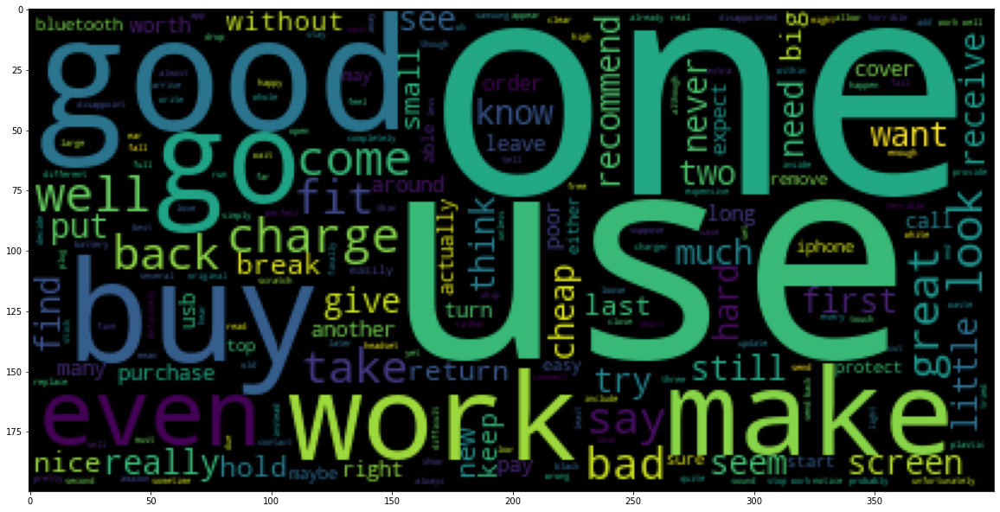

In [73]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(bad_reviews_string))

### Data Labeling

- Here to create labels, we group together 
    ratings = (4,5) into 'Good' category
    ratings = 3 as 'Neutral' Category
    ratings = (1,2) into 'Bad' Category

In [74]:
conditions=[(final_data['overall']==4)|(final_data['overall']==5),
            (final_data['overall']==3),
            (final_data['overall']==1)|(final_data['overall']==2)]
values=['Good','Neutral','Bad']

In [75]:
final_data['target']=np.select(conditions,values)
final_data['y']=final_data['target'].replace({'Good':1,'Neutral':0,'Bad':-1})

In [76]:
final_data.head()

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length,target,y
0,A30TL5EWN6DFXT,120401325X,Looks Good They look good and stick good! I ju...,4,Looks Good,NaN,NaN,39,looks good they look good and stick good i jus...,looks good they look good and stick good i jus...,good good good not like round always bump keep...,14,Good,1
1,ASY55RVNIL0UD,120401325X,Really great product. These stickers work like...,5,Really great product.,NaN,NaN,35,really great product these stickers work like ...,really great product these stickers work like ...,really great work like say stick great stylish,8,Good,1
2,A2TMXE2AFO7ONB,120401325X,LOVE LOVE LOVE These are awesome and make my p...,5,LOVE LOVE LOVE,NaN,NaN,37,love love love these are awesome and make my p...,love love love these are awesome and make my p...,love awesome make use one far almost believe o...,10,Good,1
3,AWJ0WZQYMYFQ4,120401325X,Cute! Item arrived in great time and was in pe...,4,Cute!,NaN,NaN,52,cute item arrived in great time and was in per...,cute item arrived in great time and was in per...,cute arrive great perfect however order great ...,21,Good,1
4,ATX7CZYFXI1KW,120401325X,leopard home button sticker for iphone 4s awes...,5,leopard home button sticker for iphone 4s,NaN,NaN,30,leopard home button sticker for iphone 4s awes...,leopard home button sticker for iphone 4s awes...,leopard 4 awesome look great use especially he...,9,Good,1


In [77]:
#final_data.tail()

In [78]:
final_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\Labeled_Data.csv')

### Data Partitioning

#### Splitting the data into Training Data, Validation Data and Testing Data
- First we use stratified sampling technique to split the data into training and testing set using 70:30 ratio. Stratified sampling technique will ensure that the original proportion of Good, Neutral, Positive reviews will be retained in the training and testing set
- Further, we split the test data set into validation and final test data in the ratio 66:33 i.e. 66.67% valiation data and 33.33% final test data. This final test data will be only used for prediction and model evaluation on unseen data

In [79]:
X=final_data.drop(['target','y'],axis=1)
#X.head()
y=final_data[['y']]
#y

- Step 1: Splitting data into Training and Testing

In [80]:
X_train,X_test,y_train,y_test=train_test_split(X,y, test_size=0.30, stratify=y)

In [81]:
print("Shape of X_train: ",X_train.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of X_test: ",X_test.shape)
print("Shape of y_test: ",y_test.shape)

Shape of X_train:  (135923, 12)
Shape of y_train:  (135923, 1)
Shape of X_test:  (58253, 12)
Shape of y_test:  (58253, 1)


In [82]:
training_data=pd.concat([X_train,y_train],axis=1)
training_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\Training_Data.csv')

- Splitting Testing Data into Validation and Testing

In [83]:
X_val,X_test,y_val,y_test,=train_test_split(X_test,y_test,test_size=0.33,stratify=y_test)

In [84]:
print("Shape of X_val: ",X_val.shape)
print("Shape of y_val: ",y_val.shape)
print("Shape of X_test: ",X_test.shape)
print("Shape of y_test: ",y_test.shape)

Shape of X_val:  (39029, 12)
Shape of y_val:  (39029, 1)
Shape of X_test:  (19224, 12)
Shape of y_test:  (19224, 1)


In [85]:
validation_data=pd.concat([X_val,y_val],axis=1)
validation_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\Validation_Data.csv')

In [86]:
testing_data=pd.concat([X_test,y_test],axis=1)
testing_data.to_csv(r'C:\Users\rutuj\OneDrive\Documents\0.Northeastern University MS in Data Analytics Engineering\7. Data Mining\Project\Dataset\Final_Data\Testing_Data.csv')

## Modeling

### Performance Evaluation Metrics Decision:

In [105]:
performance=pd.DataFrame(columns=['Algorithm', 'Accuracy (%) ', 'Recall (0-1)', 'Type of Dataset',
       'Text Transformation Method'])

In [106]:
def performance_evaluation(y_true,y_pred,algorithm,type_of_dataset,text_trans_method):
    
    accuracy=accuracy_score(y_true,y_pred)*100
    recall=recall_score(y_true,y_pred,average=None)[0]
    df1=pd.DataFrame({'Algorithm':[algorithm],
                      'Accuracy (%) ':[round(accuracy,2)], 
                     'Recall (0-1)':[round(recall,2)], 
                     'Type of Dataset':[type_of_dataset],
       'Text Transformation Method' : [text_trans_method]     
    })
    return df1

In [90]:
def metrics_score(actual, predicted):

    print(classification_report(actual, predicted))

    cm = confusion_matrix(actual, predicted)

    plt.figure(figsize = (8, 5))
  #  cmap = sns.diverging_palette(10, 133, as_cmap=True)
    sns.heatmap(cm, annot = True, fmt = '.2f', xticklabels = ['Bad','Neutral', 'Good'], yticklabels = ['Bad','Neutral', 'Good'],cmap='Spectral')

    plt.ylabel('Actual')

    plt.xlabel('Predicted')
    
    plt.show()

In [91]:
def metrics_score_2(actual, predicted):

    print(classification_report(actual, predicted))

    cm = confusion_matrix(actual, predicted)

    plt.figure(figsize = (8, 5))
  #  cmap = sns.diverging_palette(10, 133, as_cmap=True)
    sns.heatmap(cm, annot = True, fmt = '.2f', xticklabels = ['Good/ Neutral', 'Bad'], yticklabels = ['Good/ Neutral', 'Bad'],cmap='Spectral')

    plt.ylabel('Actual')

    plt.xlabel('Predicted')
    
    plt.show()

In [522]:
#training_data=pd.read_csv('Dataset\Training_Data.csv')
#validation_data=pd.read_csv('Dataset\Validation_Data.csv')

In [92]:
training_data.head(2)

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length,y
73131,A2MZ53M3P55PQI,B006USG7ZI,beautiful i love the fuzzy leopard area and al...,4,beautiful,by champper Luxury Designer Bling Crystal Leop...,champper,22,beautiful i love the fuzzy leopard area and al...,beautiful i love the fuzzy leopard area and al...,beautiful leopard bling exactly see get love,7,1
139561,A186W34N45FX8K,B00AB7FVCY,"great phone this is a great phone, if your har...",5,great phone,"Samsung Galaxy Note II, Titanium 16GB (Verizon...",Samsung,28,great phone this is a great phone if your hard...,great phone this is a great phone if your hard...,great great hard seeing also fat key,7,1


In [93]:
validation_data.head(2)

,reviewerID,asin,reviewText,overall,summary,title,brand,review_length,partially_cleaned_reviewText,translated_text,cleaned_reviewText,lemmatized_review_length,y
86869,AI20SQYGNWNZW,B0080AWCTY,Awesome I've bought two of these chargers and ...,5,Awesome,NaN,NaN,35,awesome i have bought two of these chargers an...,awesome i have bought two of these chargers an...,awesome buy two great evo 4g buy two one one p...,11,1
145555,A3GCJLWREAQD2N,B00AYBJ5RY,Love it!!! My wallet case came sooner than exp...,5,Love it!!!,NaN,NaN,56,love it my wallet case came sooner than expect...,love it my wallet case came sooner than expect...,love come sooner expect totally meet true post...,17,1


### Feature Transformation Using : Count Vectorization

In [94]:
vectorizer=CountVectorizer(ngram_range=(1,3),max_features=5000)
vectorizer.fit(training_data['cleaned_reviewText'].apply(lambda x: str(x)))

CountVectorizer(max_features=5000, ngram_range=(1, 3))

In [95]:
train_df=vectorizer.transform(training_data['cleaned_reviewText'].apply(lambda x: str(x)))
val_df=vectorizer.transform(validation_data['cleaned_reviewText'].apply(lambda x: str(x)))

In [289]:
#vectorizer.get_feature_names()

In [96]:
train_df.shape

(135923, 5000)

In [97]:
# To capture time required for training for each alogrithm (in seconds)
time_complexity={}

#### 1. Naive Bayes

In [107]:
%%time
nb = MultinomialNB()
nb.fit(train_df, training_data['y'])
print(nb.score(train_df, training_data['y']))
pred_target_nb=nb.predict(val_df)

0.8066773099475438
Wall time: 66.2 ms


In [108]:
time_complexity['Naive Bayes']=0.07
time_complexity

{'Naive Bayes': 0.07}

              precision    recall  f1-score   support

          -1       0.61      0.70      0.65     17027
           0       0.38      0.45      0.41     15000
           1       0.92      0.88      0.90    103896

    accuracy                           0.81    135923
   macro avg       0.64      0.67      0.65    135923
weighted avg       0.82      0.81      0.81    135923



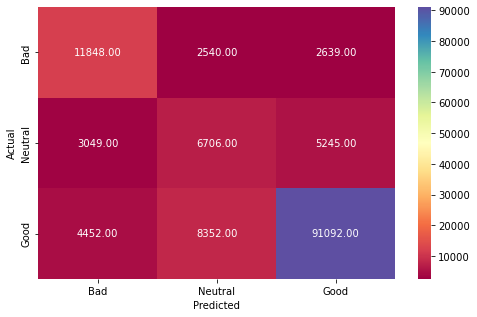

In [109]:
# Performance on Training Data
pred_train_nb=nb.predict(train_df)
metrics_score(training_data['y'],pred_train_nb)

In [110]:
df1=performance_evaluation(training_data['y'],pred_train_nb,'Naive Bayes','Training Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW


              precision    recall  f1-score   support

          -1       0.60      0.68      0.64      4889
           0       0.35      0.41      0.38      4307
           1       0.91      0.87      0.89     29833

    accuracy                           0.80     39029
   macro avg       0.62      0.65      0.63     39029
weighted avg       0.81      0.80      0.80     39029



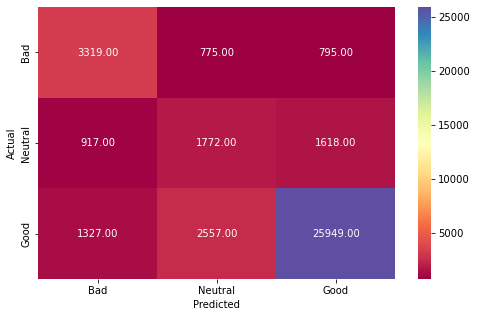

In [111]:
# Performance on Validation Data
#print(classification_report(validation_data['y'],pred_target_nb))
metrics_score(validation_data['y'],pred_target_nb)

In [112]:
df1=performance_evaluation(validation_data['y'],pred_target_nb,'Naive Bayes','Validation Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW


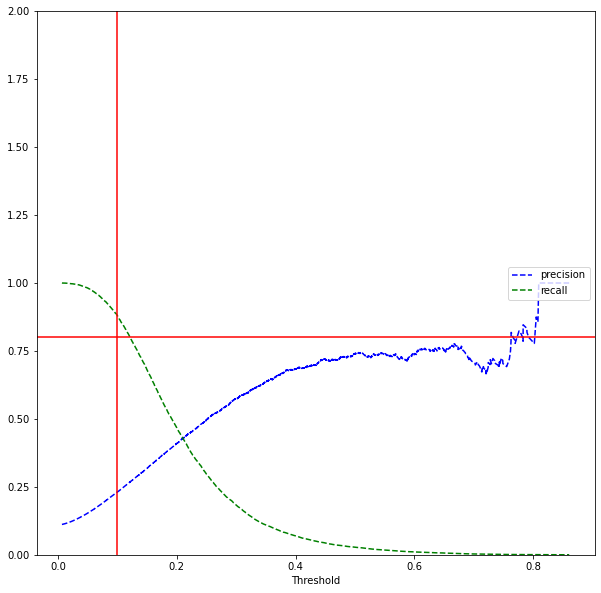

In [282]:
y_scores_nb = nb.predict_proba(train_df) # predict_proba gives the probability of each observation belonging to each class


precisions_nb, recalls_nb, thresholds_nb = precision_recall_curve(training_data['y'], y_scores_nb[:,1],pos_label=0)

# Plot values of precisions, recalls, and thresholds
plt.figure(figsize = (10, 10))

plt.plot(thresholds_nb, precisions_nb[:-1], 'b--', label = 'precision')

plt.plot(thresholds_nb, recalls_nb[:-1], 'g--', label = 'recall')

plt.xlabel('Threshold')

plt.legend(loc = 'center right')
plt.axhline(y=0.8,color='r')
plt.axvline(x=0.1,color='r')
plt.ylim([0, 2])

plt.show()

In [115]:
def convert(x):
    if x==-1:
        return 1
    else:
        return 0


In [116]:
y_train_nb=training_data['y'].apply(convert)

              precision    recall  f1-score   support

           0       0.97      0.85      0.91    118896
           1       0.45      0.84      0.59     17027

    accuracy                           0.85    135923
   macro avg       0.71      0.85      0.75    135923
weighted avg       0.91      0.85      0.87    135923



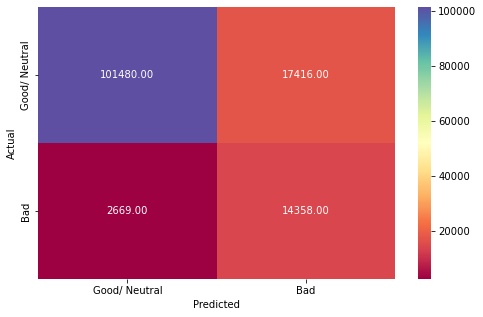

In [117]:
optimal_threshold1 = 0.1

y_pred_train = nb.predict_proba(train_df)

metrics_score_2(y_train_nb,list(map(int, y_pred_train[:, 0] > optimal_threshold1)))

In [118]:
#accuracy_score(validation_data['y'],pred_target_nb)

0.7953060544723155

In [119]:
#performance_optimized=performance_evaluation_optimized(validation_data['y'],pred_target_nb,'Naive Bayes','Validation','BOW',performance)
#performance_df

In [120]:
roc_auc_score(training_data['y'], nb.predict_proba(train_df), multi_class='ovr')

0.8773263871841869

In [121]:
y_val_nb=validation_data['y'].apply(convert)

              precision    recall  f1-score   support

           0       0.97      0.85      0.91     34140
           1       0.44      0.83      0.58      4889

    accuracy                           0.85     39029
   macro avg       0.71      0.84      0.74     39029
weighted avg       0.91      0.85      0.87     39029



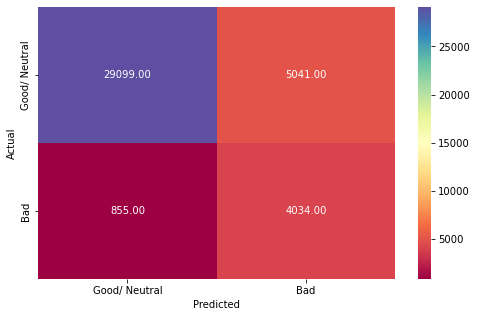

In [122]:

optimal_threshold1 = 0.1

y_pred_val = nb.predict_proba(val_df)

metrics_score_2(y_val_nb,list(map(int, y_pred_val[:, 0] > optimal_threshold1)))

#### 2. Logistic Regression

In [123]:
%%time
lr=LogisticRegression()
lr.fit(train_df,training_data['y'])
print(lr.score(train_df,training_data['y']))
pred_target_lr=lr.predict(val_df)

0.862238178968975
Wall time: 6.21 s


In [124]:
time_complexity['Logistic Regression']=6.21
time_complexity

{'Naive Bayes': 0.07, 'Logistic Regression': 6.65}

              precision    recall  f1-score   support

          -1       0.76      0.70      0.73     17027
           0       0.61      0.32      0.42     15000
           1       0.89      0.97      0.93    103896

    accuracy                           0.86    135923
   macro avg       0.76      0.66      0.69    135923
weighted avg       0.85      0.86      0.85    135923



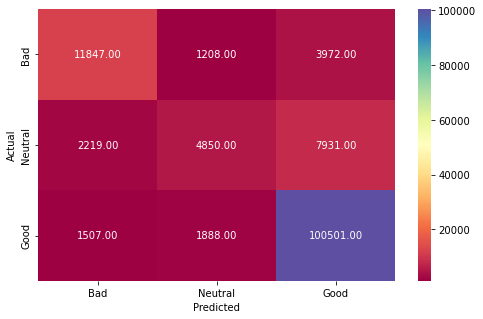

In [125]:
# Performance on Training Data
pred_train_lr=lr.predict(train_df)
metrics_score(training_data['y'],pred_train_lr)

In [126]:
df1=performance_evaluation(training_data['y'],pred_train_lr,'Logistic Regression','Training Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW


              precision    recall  f1-score   support

          -1       0.70      0.64      0.67      4889
           0       0.46      0.25      0.32      4307
           1       0.88      0.95      0.92     29833

    accuracy                           0.84     39029
   macro avg       0.68      0.62      0.64     39029
weighted avg       0.81      0.84      0.82     39029



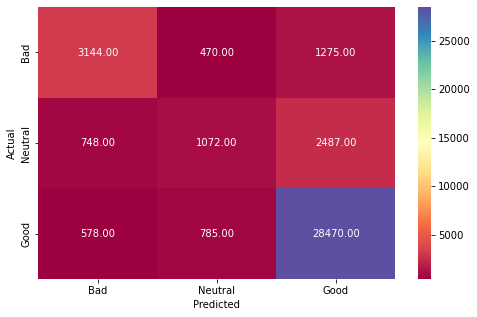

In [127]:
# Performance on Validation Data
#print(classification_report(validation_data['y'],pred_target_lr))
metrics_score(validation_data['y'],pred_target_lr)

In [128]:
df1=performance_evaluation(validation_data['y'],pred_target_lr,'Logistic Regression','Validation Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW


In [129]:
roc_auc_score(training_data['y'], lr.predict_proba(train_df), multi_class='ovr')

0.9224569513045834

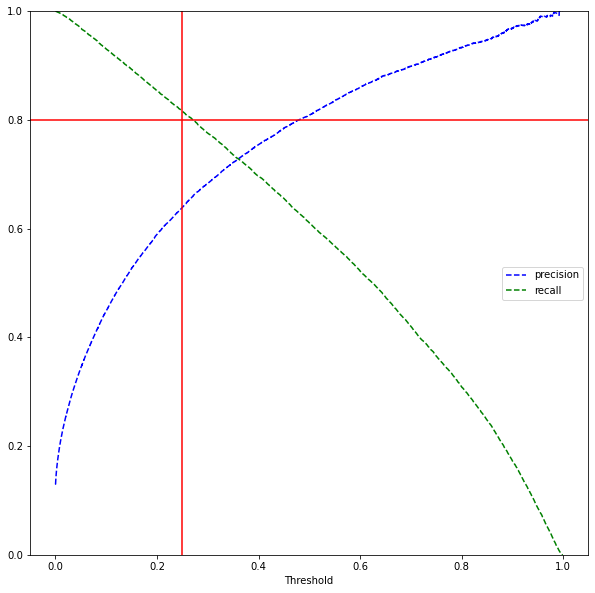

In [281]:
y_scores_lg = lr.predict_proba(train_df) # predict_proba gives the probability of each observation belonging to each class


precisions_lg, recalls_lg, thresholds_lg = precision_recall_curve(training_data['y'], y_scores_lg[:,0],pos_label=-1)

# Plot values of precisions, recalls, and thresholds
plt.figure(figsize = (10, 10))

plt.plot(thresholds_lg, precisions_lg[:-1], 'b--', label = 'precision')

plt.plot(thresholds_lg, recalls_lg[:-1], 'g--', label = 'recall')

plt.xlabel('Threshold')

plt.legend(loc = 'center right')

plt.ylim([0, 1])
plt.axhline(y=0.80,color='r')
plt.axvline(x=0.25,color='r')

plt.show()

In [221]:
#list(map(int, y_pred_train[:, 0] > optimal_threshold1))

In [131]:
def convert(x):
    if x==-1:
        return 1
    else:
        return 0


In [132]:
training_data['y'].value_counts()

 1    103896
-1     17027
 0     15000
Name: y, dtype: int64

In [134]:
y_train_lr=training_data['y'].apply(convert)

              precision    recall  f1-score   support

           0       0.98      0.92      0.95    118896
           1       0.61      0.85      0.71     17027

    accuracy                           0.91    135923
   macro avg       0.79      0.89      0.83    135923
weighted avg       0.93      0.91      0.92    135923



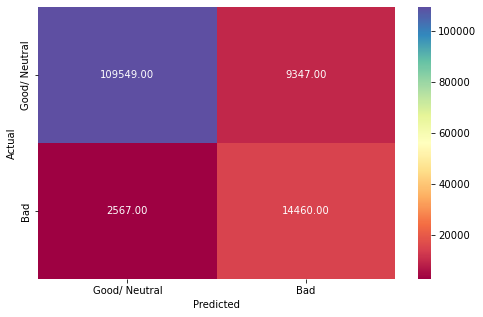

In [139]:
optimal_threshold1 = 0.2

y_pred_train = lr.predict_proba(train_df)

metrics_score_2(y_train_lr,list(map(int, y_pred_train[:, 0] > optimal_threshold1)))

In [136]:
y_val_lr=validation_data['y'].apply(convert)

              precision    recall  f1-score   support

           0       0.97      0.91      0.94     34140
           1       0.56      0.80      0.66      4889

    accuracy                           0.90     39029
   macro avg       0.77      0.85      0.80     39029
weighted avg       0.92      0.90      0.90     39029



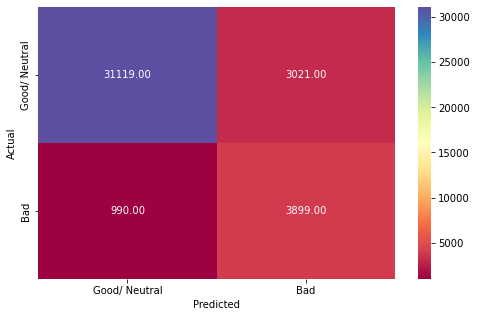

In [138]:
optimal_threshold1 = 0.2

y_pred_val = lr.predict_proba(val_df)

metrics_score_2(y_val_lr,list(map(int, y_pred_val[:, 0] > optimal_threshold1)))

### 3. Random Forest

In [140]:
def xgbchange(n):
    if n ==-1:
        return 0
    elif n==0:
        return 1
    else:
        return 2

In [141]:
training_data['y_xgb'] = training_data['y'].apply(xgbchange)
validation_data['y_xgb'] = validation_data['y'].apply(xgbchange)

In [142]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

In [143]:
%%time
rf = RandomForestClassifier(n_estimators=300,max_depth=20, random_state=23,verbose=-1,n_jobs=-1)
rf.fit(train_df,training_data['y_xgb'])
print(rf.score(train_df,training_data['y_xgb']))
pred_target_rf=rf.predict(val_df)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   15.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 264 tasks      | elapsed:    0.7s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.7s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  48 tasks      | elapsed:    0.0s


0.7748063241688309
Wall time: 16.6 s


[Parallel(n_jobs=12)]: Done 264 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.1s finished


In [146]:
time_complexity['Random Forest']=16.6
time_complexity

{'Naive Bayes': 0.07, 'Logistic Regression': 6.65, 'Random Forest': 16.6}

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  48 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 264 tasks      | elapsed:    0.6s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.7s finished


              precision    recall  f1-score   support

           0       0.96      0.08      0.14     17027
           1       0.99      0.01      0.01     15000
           2       0.77      1.00      0.87    103896

    accuracy                           0.77    135923
   macro avg       0.91      0.36      0.34    135923
weighted avg       0.82      0.77      0.69    135923



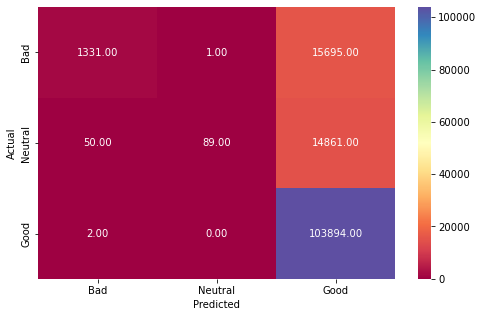

In [145]:
# Performance on Training Data
pred_train_rf=rf.predict(train_df)
metrics_score(training_data['y_xgb'],pred_train_rf)

In [147]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_rf,'Random Forest','Training Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW


              precision    recall  f1-score   support

           0       0.91      0.05      0.10      4889
           1       0.00      0.00      0.00      4307
           2       0.77      1.00      0.87     29833

    accuracy                           0.77     39029
   macro avg       0.56      0.35      0.32     39029
weighted avg       0.70      0.77      0.68     39029



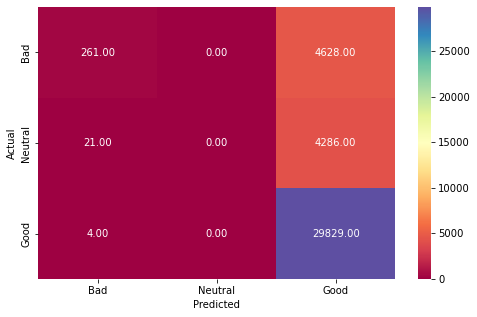

In [148]:
# Performance on Validation Data
#print(classification_report(validation_data['y_xgb'],pred_target_rf))
metrics_score(validation_data['y_xgb'],pred_target_rf)

In [149]:
df1=performance_evaluation(validation_data['y_xgb'],pred_target_rf,'Random Forest','Validation Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW


### 4. XGBoost

In [150]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

In [151]:
%%time
xgb.fit(train_df,training_data['y_xgb'])

Wall time: 12.2 s


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=6,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, ...)

In [152]:
print(xgb.score(train_df,training_data['y_xgb']))
pred_target_xgb=xgb.predict(val_df)

0.8596705487665811


In [153]:
time_complexity['XGBoost']=12.2
time_complexity

{'Naive Bayes': 0.07,
 'Logistic Regression': 6.65,
 'Random Forest': 16.6,
 'XGBoost': 12.2}

              precision    recall  f1-score   support

           0       0.80      0.63      0.70     17027
           1       0.73      0.27      0.40     15000
           2       0.87      0.98      0.92    103896

    accuracy                           0.86    135923
   macro avg       0.80      0.63      0.68    135923
weighted avg       0.85      0.86      0.84    135923



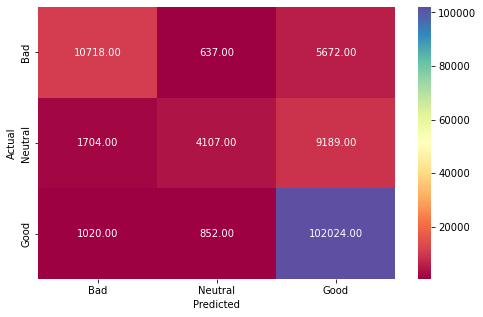

In [154]:
# Performnce on Training Data
pred_train_xgb=xgb.predict(train_df)
metrics_score(training_data['y_xgb'],pred_train_xgb)

In [155]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_xgb,'XGBoost','Training Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW


              precision    recall  f1-score   support

           0       0.73      0.56      0.63      4889
           1       0.55      0.18      0.27      4307
           2       0.86      0.97      0.91     29833

    accuracy                           0.83     39029
   macro avg       0.71      0.57      0.60     39029
weighted avg       0.81      0.83      0.80     39029



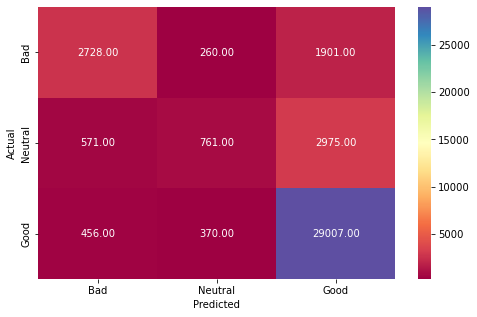

In [156]:
# Performance on Validation Data
metrics_score(validation_data['y_xgb'],pred_target_xgb)
#print(classification_report(validation_data['y_xgb'],pred_target_xgb))

In [157]:
df1=performance_evaluation(validation_data['y_xgb'],pred_target_xgb,'XGBoost','Validation Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW


### 5. Neural Networks

In [158]:
y_train=to_categorical(training_data['y_xgb'],3)
y_train

array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.]], dtype=float32)

In [159]:
y_val=to_categorical(validation_data['y_xgb'],3)
y_val

array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.]], dtype=float32)

In [160]:
keras_model=Sequential()

#Input Layer
keras_model.add(Dense(64,input_dim=5000,activation='relu'))
keras_model.add(Dropout(0.5))
#Hidden layers
keras_model.add(Dense(256,kernel_initializer='normal',activation='tanh'))
keras_model.add(Dense(256,kernel_initializer='normal',activation='tanh'))
keras_model.add(Dropout(0.5))
#Output Layers
keras_model.add(Dense(3,activation='softmax'))

sgd=SGD(lr=0.01,decay=1e-6,momentum=0.9,nesterov=True)

In [161]:
keras_model.compile(optimizer=sgd,loss='categorical_crossentropy',metrics=['accuracy'])

In [162]:
keras_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                320064    
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 256)               16640     
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 3)                 771       
                                                                 
Total params: 403,267
Trainable params: 403,267
Non-trai

In [163]:
#keras_model.fit(train_df.toarray(),y_train,batch_size=128,epochs=200)
history=keras_model.fit(train_df.toarray(),y_train,batch_size=128,epochs=100,validation_split=0.25,verbose=2)

Epoch 1/100
797/797 - 6s - loss: 0.5439 - accuracy: 0.7965 - val_loss: 0.4450 - val_accuracy: 0.8291 - 6s/epoch - 8ms/step
Epoch 2/100
797/797 - 5s - loss: 0.4554 - accuracy: 0.8267 - val_loss: 0.4220 - val_accuracy: 0.8409 - 5s/epoch - 6ms/step
Epoch 3/100
797/797 - 5s - loss: 0.4313 - accuracy: 0.8363 - val_loss: 0.4131 - val_accuracy: 0.8433 - 5s/epoch - 6ms/step
Epoch 4/100
797/797 - 4s - loss: 0.4147 - accuracy: 0.8411 - val_loss: 0.4119 - val_accuracy: 0.8449 - 4s/epoch - 6ms/step
Epoch 5/100
797/797 - 4s - loss: 0.4034 - accuracy: 0.8451 - val_loss: 0.4072 - val_accuracy: 0.8454 - 4s/epoch - 5ms/step
Epoch 6/100
797/797 - 4s - loss: 0.3931 - accuracy: 0.8482 - val_loss: 0.4055 - val_accuracy: 0.8473 - 4s/epoch - 5ms/step
Epoch 7/100
797/797 - 4s - loss: 0.3846 - accuracy: 0.8515 - val_loss: 0.4058 - val_accuracy: 0.8475 - 4s/epoch - 5ms/step
Epoch 8/100
797/797 - 4s - loss: 0.3759 - accuracy: 0.8543 - val_loss: 0.4090 - val_accuracy: 0.8474 - 4s/epoch - 5ms/step
Epoch 9/100
797/

In [164]:
def plot_metric(history,metric):
    training_metrics=history.history[metric]
    validation_metrics=history.history['val_'+metric]
    epochs=range(1,len(training_metrics)+1)
    plt.plot(epochs,training_metrics)
    plt.plot(epochs,validation_metrics)
    plt.title('Training and Validation '+metric)
    plt.xlabel("Number of Epochs")
    plt.ylabel(metric)
    plt.ylim([0,1.5])
    plt.legend(["training_"+metric, 'validation_'+metric])
    plt.show()


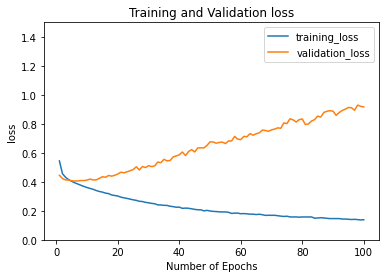

In [165]:
plot_metric(history, 'loss')

In [166]:
pred_target_nn=keras_model.predict(val_df.toarray())

1220/1220 [==============================] - 1s 1ms/step


In [167]:
predicted_target_neural_network=pred_target_nn.argmax(axis=1)

In [168]:
predicted_target_neural_network

array([2, 2, 2, ..., 1, 2, 2], dtype=int64)

In [169]:
set(predicted_target_neural_network)

{0, 1, 2}

In [300]:
##### Check
# Performnce on Training Data
#pred_train_nn=keras_model.predict(train_df.toarray())
#pred_train_nn=pred_target_nn.argmax(axis=1)
#metrics_score(y_train,pred_train_nn)

              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4889
           1       0.41      0.28      0.33      4307
           2       0.89      0.94      0.92     29833

    accuracy                           0.83     39029
   macro avg       0.66      0.62      0.64     39029
weighted avg       0.81      0.83      0.82     39029



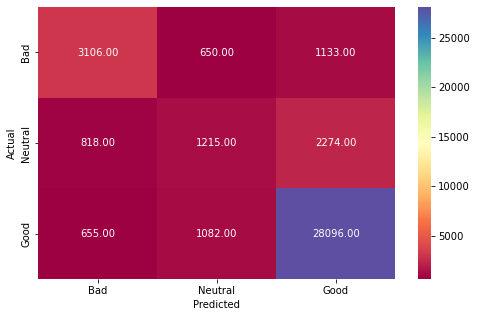

In [170]:
#print(classification_report(validation_data['y_xgb'],predicted_target_neural_network))
metrics_score(validation_data['y_xgb'],predicted_target_neural_network)

In [374]:
### Adding Early Stopping

In [171]:
customized_early_stopping = EarlyStopping(
    monitor='val_accuracy', 
    patience=5, 
    min_delta=0.001, 
    mode='max'
)

# monitor='val_accuracy' indicates


monitor='val_accuracy' to use validation accuracy as performance measure to terminate the training. patience=8 means the training is terminated as soon as 8 epochs with no improvement. min_delta=0.001 means the validation accuracy has to improve by at least 0.001 for it to count as an improvement. mode='max' means it will stop when the quantity monitored has stopped increasing.

In [172]:
history=keras_model.fit(train_df.toarray(),y_train,batch_size=128,epochs=100,validation_split=0.25,verbose=2,
                        callbacks=[customized_early_stopping])

Epoch 1/100
797/797 - 5s - loss: 0.1385 - accuracy: 0.9389 - val_loss: 0.9126 - val_accuracy: 0.8275 - 5s/epoch - 6ms/step
Epoch 2/100
797/797 - 4s - loss: 0.1383 - accuracy: 0.9390 - val_loss: 0.9313 - val_accuracy: 0.8354 - 4s/epoch - 5ms/step
Epoch 3/100
797/797 - 4s - loss: 0.1363 - accuracy: 0.9402 - val_loss: 0.9509 - val_accuracy: 0.8358 - 4s/epoch - 5ms/step
Epoch 4/100
797/797 - 4s - loss: 0.1360 - accuracy: 0.9396 - val_loss: 0.9276 - val_accuracy: 0.8315 - 4s/epoch - 5ms/step
Epoch 5/100
797/797 - 4s - loss: 0.1359 - accuracy: 0.9392 - val_loss: 0.9698 - val_accuracy: 0.8352 - 4s/epoch - 5ms/step
Epoch 6/100
797/797 - 4s - loss: 0.1339 - accuracy: 0.9413 - val_loss: 0.9486 - val_accuracy: 0.8355 - 4s/epoch - 5ms/step
Epoch 7/100
797/797 - 4s - loss: 0.1345 - accuracy: 0.9413 - val_loss: 0.9547 - val_accuracy: 0.8296 - 4s/epoch - 5ms/step


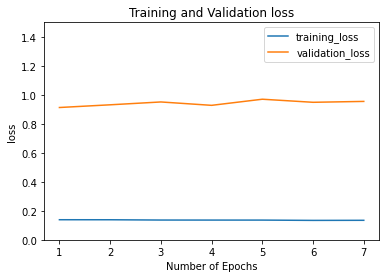

In [173]:
plot_metric(history, 'loss')

4248/4248 [==============================] - 5s 1ms/step
              precision    recall  f1-score   support

           0       0.91      0.89      0.90     17027
           1       0.83      0.80      0.82     15000
           2       0.97      0.98      0.97    103896

    accuracy                           0.95    135923
   macro avg       0.91      0.89      0.90    135923
weighted avg       0.95      0.95      0.95    135923



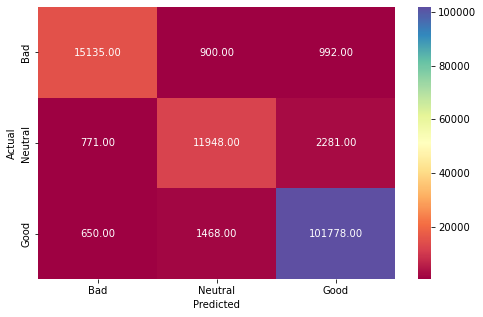

In [174]:
# Performnce on Training Data
pred_train_nn=keras_model.predict(train_df.toarray())
pred_train_nn_=pred_train_nn.argmax(axis=1)
metrics_score(training_data['y_xgb'],pred_train_nn_)

In [175]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_nn_,'Neural Networks','Training Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW


In [176]:
# Performance on Validation Data
pred_target_nn=keras_model.predict(val_df.toarray())
predicted_target_neural_network=pred_target_nn.argmax(axis=1)
predicted_target_neural_network

1220/1220 [==============================] - 1s 1ms/step


array([2, 2, 2, ..., 1, 2, 2], dtype=int64)

              precision    recall  f1-score   support

           0       0.69      0.62      0.65      4889
           1       0.40      0.34      0.37      4307
           2       0.90      0.93      0.91     29833

    accuracy                           0.83     39029
   macro avg       0.66      0.63      0.64     39029
weighted avg       0.82      0.83      0.82     39029



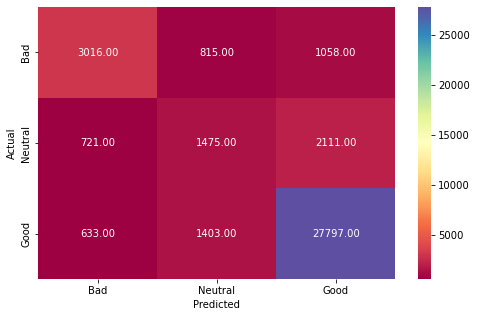

In [177]:
#print(classification_report(validation_data['y_xgb'],predicted_target_neural_network))
metrics_score(validation_data['y_xgb'],predicted_target_neural_network)

In [179]:
df1=performance_evaluation(validation_data['y_xgb'],predicted_target_neural_network,'Neural Networks','Validation Set','BOW')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


### Feature Transformation Using : TF-IDF

In [180]:
%%time
tfidf_vectorizer=TfidfVectorizer(min_df=5,ngram_range=(1,3),max_features=5000)
tfidf_vectorizer.fit(training_data['cleaned_reviewText'].apply(lambda x:str(x)))

Wall time: 25.9 s


TfidfVectorizer(max_features=5000, min_df=5, ngram_range=(1, 3))

In [181]:
train_df=tfidf_vectorizer.transform(training_data['cleaned_reviewText'].apply(lambda x: str(x)))
val_df=vectorizer.transform(validation_data['cleaned_reviewText'].apply(lambda x: str(x)))

In [386]:
#print(tfidf_vectorizer.get_feature_names())

#### 1. Naive Bayes

In [182]:
%%time
nb = MultinomialNB()
nb.fit(train_df, training_data['y'])
print(nb.score(train_df, training_data['y']))
pred_target_nb=nb.predict(val_df)

0.8170434731428824
Wall time: 70.5 ms


In [183]:
time_complexity_TF_IDF={}
time_complexity_TF_IDF['Naive Bayes']=0.08

              precision    recall  f1-score   support

          -1       0.81      0.41      0.54     17027
           0       0.66      0.07      0.12     15000
           1       0.82      0.99      0.90    103896

    accuracy                           0.82    135923
   macro avg       0.77      0.49      0.52    135923
weighted avg       0.80      0.82      0.77    135923



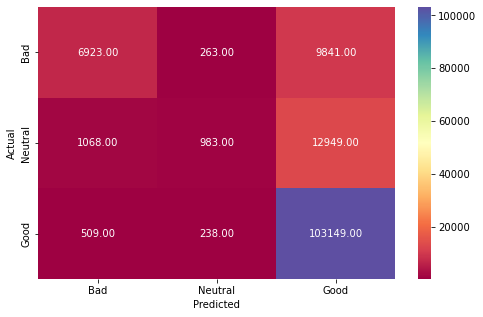

In [184]:
# Performance on Training Data
pred_train_nb=nb.predict(train_df)
metrics_score(training_data['y'],pred_train_nb)


In [185]:
df1=performance_evaluation(training_data['y'],pred_train_nb,'Naive Bayes','Training Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


              precision    recall  f1-score   support

          -1       0.52      0.55      0.53      4889
           0       0.28      0.48      0.35      4307
           1       0.91      0.80      0.85     29833

    accuracy                           0.73     39029
   macro avg       0.57      0.61      0.58     39029
weighted avg       0.79      0.73      0.76     39029



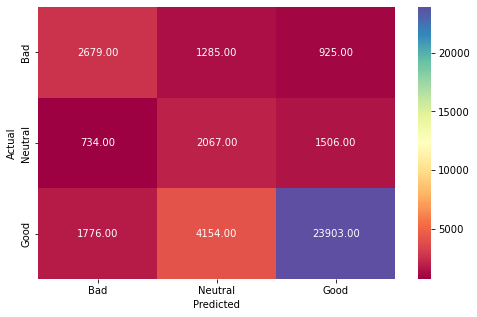

In [186]:
# Performance on Validation Data
#print(classification_report(validation_data['y'],pred_target_nb))
metrics_score(validation_data['y'],pred_target_nb)


In [187]:
print(classification_report(validation_data['y'],pred_target_nb))

              precision    recall  f1-score   support

          -1       0.52      0.55      0.53      4889
           0       0.28      0.48      0.35      4307
           1       0.91      0.80      0.85     29833

    accuracy                           0.73     39029
   macro avg       0.57      0.61      0.58     39029
weighted avg       0.79      0.73      0.76     39029



In [188]:
df1=performance_evaluation(validation_data['y'],pred_target_nb,'Naive Bayes','Validation Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


#### 2. Logistic Regression

In [189]:
%%time
lr=LogisticRegression()
lr.fit(train_df,training_data['y'])
print(lr.score(train_df,training_data['y']))
pred_target_lr=lr.predict(val_df)

0.8604062594262928
Wall time: 6.04 s


In [191]:
time_complexity_TF_IDF['Logistic Regression']=6.04

In [192]:
#print(classification_report(validation_data['y'],pred_target_lr))

              precision    recall  f1-score   support

          -1       0.76      0.69      0.72     17027
           0       0.62      0.29      0.39     15000
           1       0.89      0.97      0.93    103896

    accuracy                           0.86    135923
   macro avg       0.75      0.65      0.68    135923
weighted avg       0.84      0.86      0.84    135923



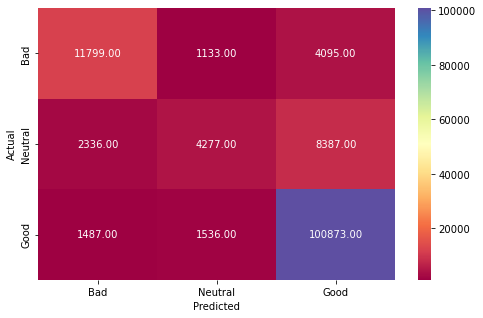

In [193]:
# Performance on Training Data
pred_train_lr=lr.predict(train_df)
metrics_score(training_data['y'],pred_train_lr)


In [194]:
df1=performance_evaluation(training_data['y'],pred_train_lr,'Logistic Regression','Training Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


              precision    recall  f1-score   support

          -1       0.54      0.41      0.47      4889
           0       0.30      0.21      0.24      4307
           1       0.84      0.91      0.88     29833

    accuracy                           0.77     39029
   macro avg       0.56      0.51      0.53     39029
weighted avg       0.75      0.77      0.76     39029



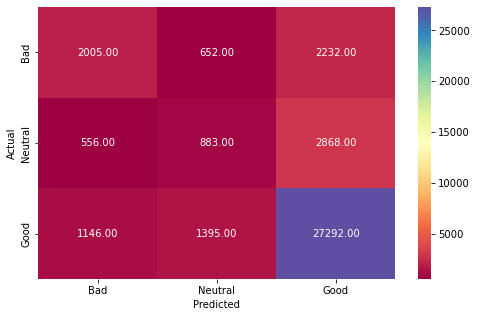

In [195]:
# Performance on Validation Data
#print(classification_report(validation_data['y'],pred_target_lr))
metrics_score(validation_data['y'],pred_target_lr)


In [196]:
df1=performance_evaluation(validation_data['y'],pred_target_lr,'Logistic Regression','Validation Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


#### 4. Random Forest


In [197]:
def xgbchange(n):
    if n ==-1:
        return 0
    elif n==0:
        return 1
    else:
        return 2


In [198]:
training_data['y_xgb'] = training_data['y'].apply(xgbchange)
validation_data['y_xgb'] = validation_data['y'].apply(xgbchange)

In [199]:
%%time
rf = RandomForestClassifier(n_estimators=100,max_depth=20, random_state=23)
rf.fit(train_df,training_data['y_xgb'])
print(rf.score(train_df,training_data['y_xgb']))
pred_target_rf=rf.predict(val_df)

0.775255107671255
Wall time: 19.4 s


In [200]:
time_complexity_TF_IDF['Random Forest']=19.4

              precision    recall  f1-score   support

           0       0.95      0.09      0.16     17027
           1       0.95      0.00      0.00     15000
           2       0.77      1.00      0.87    103896

    accuracy                           0.78    135923
   macro avg       0.89      0.36      0.34    135923
weighted avg       0.82      0.78      0.69    135923



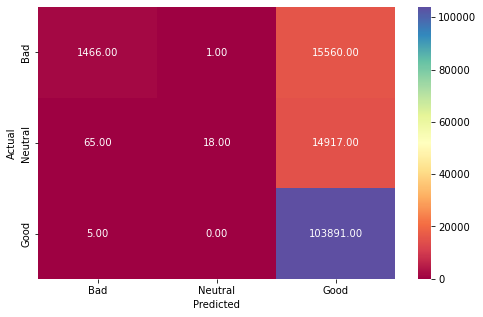

In [201]:
# Performance on Training Data
pred_train_rf=rf.predict(train_df)
metrics_score(training_data['y_xgb'],pred_train_rf)


In [202]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_rf,'Random Forest','Training Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


              precision    recall  f1-score   support

           0       0.85      0.02      0.04      4889
           1       0.00      0.00      0.00      4307
           2       0.77      1.00      0.87     29833

    accuracy                           0.77     39029
   macro avg       0.54      0.34      0.30     39029
weighted avg       0.69      0.77      0.67     39029



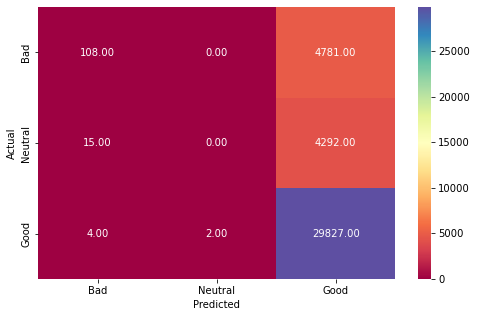

In [203]:
# Performance on Validation Data
#print(classification_report(validation_data['y_xgb'],pred_target_rf))
metrics_score(validation_data['y_xgb'],pred_target_rf)


In [204]:
df1=performance_evaluation(validation_data['y_xgb'],pred_target_rf,'Random Forest','Validation Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


#### 4. XGBoost

In [205]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

In [206]:
def xgbchange(n):
    if n ==-1:
        return 0
    elif n==0:
        return 1
    else:
        return 2

In [207]:
training_data['y_xgb'] = training_data['y'].apply(xgbchange)
validation_data['y_xgb'] = validation_data['y'].apply(xgbchange)

In [208]:
%%time
xgb.fit(train_df,training_data['y_xgb'])

Wall time: 1min 8s


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_to_onehot=4, max_delta_step=0, max_depth=6,
              max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, ...)

In [209]:
time_complexity_TF_IDF['XGBoost']=71

In [210]:
#print(classification_report(validation_data['y_xgb'],pred_target_rf))

In [211]:
#confusion_matrix(validation_data['y_xgb'],pred_target_rf)

In [212]:
print(xgb.score(train_df,training_data['y_xgb']))
pred_target_xgb=xgb.predict(val_df)

0.8635624581564563


              precision    recall  f1-score   support

           0       0.81      0.65      0.72     17027
           1       0.76      0.28      0.41     15000
           2       0.88      0.98      0.93    103896

    accuracy                           0.86    135923
   macro avg       0.81      0.64      0.68    135923
weighted avg       0.85      0.86      0.84    135923



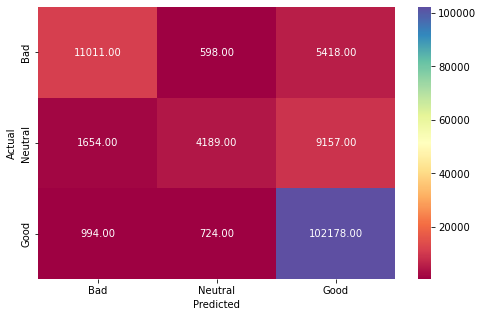

In [213]:
# Performnce on Training Data
pred_train_xgb=xgb.predict(train_df)
metrics_score(training_data['y_xgb'],pred_train_xgb)


In [214]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_xgb,'XGBoost','Training Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


              precision    recall  f1-score   support

           0       0.60      0.18      0.28      4889
           1       0.24      0.11      0.15      4307
           2       0.80      0.95      0.86     29833

    accuracy                           0.76     39029
   macro avg       0.55      0.41      0.43     39029
weighted avg       0.71      0.76      0.71     39029



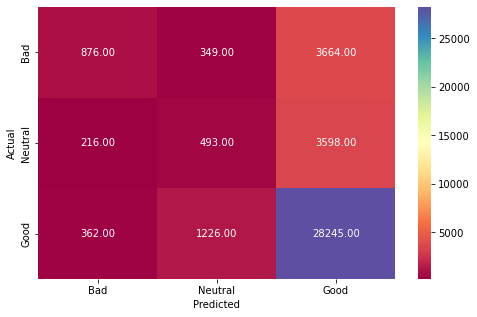

In [215]:
#print(classification_report(validation_data['y_xgb'],pred_target_xgb))
# Performance on Validation Data
metrics_score(validation_data['y_xgb'],pred_target_xgb)
#print(classification_report(validation_data['y_xgb'],pred_target_xgb))



In [216]:
df1=performance_evaluation(validation_data['y_xgb'],pred_target_xgb,'XGBoost','Validation Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


In [217]:
### Neural Networks

In [218]:
keras_model=Sequential()

#Input Layer
keras_model.add(Dense(64,input_dim=5000,activation='relu'))
keras_model.add(Dropout(0.5))
#Hidden layers
keras_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
keras_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
keras_model.add(Dropout(0.5))
#Output Layers
keras_model.add(Dense(3,activation='softmax'))

sgd=SGD(lr=0.01,decay=1e-6,momentum=0.9,nesterov=True)




In [219]:
### 
keras_model.compile(optimizer=sgd,loss='categorical_crossentropy',metrics=['accuracy'])

In [220]:
###
keras_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 64)                320064    
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 256)               16640     
                                                                 
 dense_6 (Dense)             (None, 256)               65792     
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 3)                 771       
                                                                 
Total params: 403,267
Trainable params: 403,267
Non-tr

In [221]:
history=keras_model.fit(train_df.toarray(),y_train,batch_size=64,epochs=50,validation_split=0.25,verbose=2)

Epoch 1/50
1593/1593 - 6s - loss: 0.6537 - accuracy: 0.7734 - val_loss: 0.4678 - val_accuracy: 0.8253 - 6s/epoch - 4ms/step
Epoch 2/50
1593/1593 - 5s - loss: 0.4744 - accuracy: 0.8196 - val_loss: 0.4288 - val_accuracy: 0.8354 - 5s/epoch - 3ms/step
Epoch 3/50
1593/1593 - 4s - loss: 0.4410 - accuracy: 0.8286 - val_loss: 0.4224 - val_accuracy: 0.8380 - 4s/epoch - 3ms/step
Epoch 4/50
1593/1593 - 4s - loss: 0.4278 - accuracy: 0.8324 - val_loss: 0.4259 - val_accuracy: 0.8363 - 4s/epoch - 3ms/step
Epoch 5/50
1593/1593 - 5s - loss: 0.4170 - accuracy: 0.8360 - val_loss: 0.4131 - val_accuracy: 0.8407 - 5s/epoch - 3ms/step
Epoch 6/50
1593/1593 - 5s - loss: 0.4091 - accuracy: 0.8409 - val_loss: 0.4125 - val_accuracy: 0.8424 - 5s/epoch - 3ms/step
Epoch 7/50
1593/1593 - 5s - loss: 0.4009 - accuracy: 0.8442 - val_loss: 0.4090 - val_accuracy: 0.8451 - 5s/epoch - 3ms/step
Epoch 8/50
1593/1593 - 5s - loss: 0.3925 - accuracy: 0.8483 - val_loss: 0.4088 - val_accuracy: 0.8482 - 5s/epoch - 3ms/step
Epoch 9/

In [222]:
def plot_metric(history,metric):
    training_metrics=history.history[metric]
    validation_metrics=history.history['val_'+metric]
    epochs=range(1,len(training_metrics)+1)
    plt.plot(epochs,training_metrics)
    plt.plot(epochs,validation_metrics)
    plt.title('Training and Validation '+metric)
    plt.xlabel("Number of Epochs")
    plt.ylabel(metric)
    plt.ylim([0,1.5])
    plt.legend(["training_"+metric, 'validation_'+metric])
    plt.show()


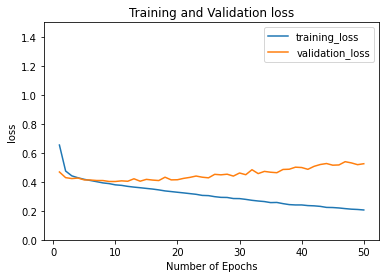

In [223]:
plot_metric(history, 'loss')

In [224]:
pred_target_nn=keras_model.predict(val_df.toarray())


1220/1220 [==============================] - 1s 1ms/step


In [226]:
predicted_target_neural_network=pred_target_nn.argmax(axis=1)

In [227]:
print(classification_report(validation_data['y_xgb'],predicted_target_neural_network))

              precision    recall  f1-score   support

           0       0.43      0.51      0.47      4889
           1       0.33      0.08      0.13      4307
           2       0.84      0.91      0.87     29833

    accuracy                           0.77     39029
   macro avg       0.53      0.50      0.49     39029
weighted avg       0.73      0.77      0.74     39029



In [228]:
customized_early_stopping = EarlyStopping(
    monitor='val_accuracy', 
    patience=5, 
    min_delta=0.001, 
    mode='max'
)

# monitor='val_accuracy' indicates
history=keras_model.fit(train_df.toarray(),y_train,batch_size=128,epochs=100,validation_split=0.25,verbose=2,
                        callbacks=[customized_early_stopping])


Epoch 1/100
797/797 - 4s - loss: 0.1734 - accuracy: 0.9343 - val_loss: 0.5572 - val_accuracy: 0.8310 - 4s/epoch - 6ms/step
Epoch 2/100
797/797 - 3s - loss: 0.1692 - accuracy: 0.9360 - val_loss: 0.6101 - val_accuracy: 0.8398 - 3s/epoch - 4ms/step
Epoch 3/100
797/797 - 3s - loss: 0.1639 - accuracy: 0.9374 - val_loss: 0.5895 - val_accuracy: 0.8315 - 3s/epoch - 4ms/step
Epoch 4/100
797/797 - 3s - loss: 0.1621 - accuracy: 0.9373 - val_loss: 0.6236 - val_accuracy: 0.8374 - 3s/epoch - 4ms/step
Epoch 5/100
797/797 - 3s - loss: 0.1589 - accuracy: 0.9386 - val_loss: 0.5989 - val_accuracy: 0.8320 - 3s/epoch - 4ms/step
Epoch 6/100
797/797 - 3s - loss: 0.1555 - accuracy: 0.9406 - val_loss: 0.6214 - val_accuracy: 0.8330 - 3s/epoch - 4ms/step
Epoch 7/100
797/797 - 3s - loss: 0.1538 - accuracy: 0.9408 - val_loss: 0.6413 - val_accuracy: 0.8386 - 3s/epoch - 4ms/step


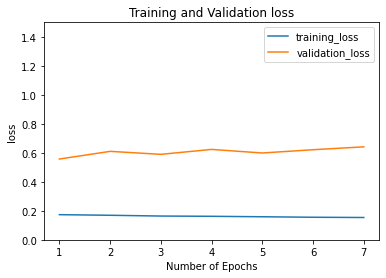

In [229]:
plot_metric(history, 'loss')

4248/4248 [==============================] - 3s 784us/step
              precision    recall  f1-score   support

           0       0.86      0.91      0.88     17027
           1       0.87      0.72      0.79     15000
           2       0.97      0.98      0.97    103896

    accuracy                           0.94    135923
   macro avg       0.90      0.87      0.88    135923
weighted avg       0.94      0.94      0.94    135923



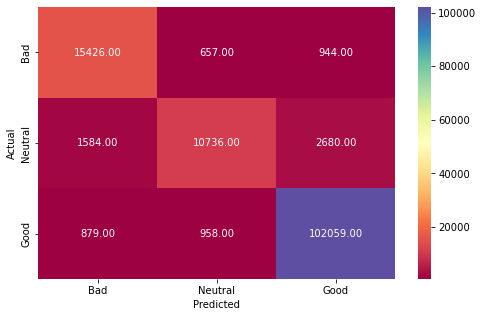

In [230]:
pred_train_nn=keras_model.predict(train_df.toarray())
pred_train_nn_=pred_train_nn.argmax(axis=1)
metrics_score(training_data['y_xgb'],pred_train_nn_)

In [231]:
df1=performance_evaluation(training_data['y_xgb'],pred_train_nn_,'Neural Networks','Training Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


In [232]:
pred_target_nn=keras_model.predict(val_df.toarray())
predicted_target_neural_network=pred_target_nn.argmax(axis=1)

1220/1220 [==============================] - 1s 1ms/step


In [233]:
predicted_target_neural_network

array([2, 2, 2, ..., 0, 2, 2], dtype=int64)

In [234]:
print(classification_report(validation_data['y_xgb'],predicted_target_neural_network))

              precision    recall  f1-score   support

           0       0.44      0.51      0.47      4889
           1       0.32      0.07      0.12      4307
           2       0.84      0.91      0.87     29833

    accuracy                           0.77     39029
   macro avg       0.53      0.50      0.49     39029
weighted avg       0.73      0.77      0.74     39029



In [235]:
df1=performance_evaluation(validation_data['y_xgb'],predicted_target_neural_network,'Neural Networks','Validation Set','TF-IDF')
performance=pd.concat([performance,df1])
performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
0,Naive Bayes,79.53,0.68,Validation Set,BOW
0,Logistic Regression,86.22,0.7,Training Set,BOW
0,Logistic Regression,83.75,0.64,Validation Set,BOW
0,Random Forest,77.48,0.08,Training Set,BOW
0,Random Forest,77.1,0.05,Validation Set,BOW
0,XGBoost,85.97,0.63,Training Set,BOW
0,XGBoost,83.26,0.56,Validation Set,BOW
0,Neural Networks,94.8,0.89,Training Set,BOW
0,Neural Networks,94.8,0.89,Validation Set,BOW


In [191]:
#performance={'Algorithm':['Naive Bayes','Logistic Regression','Random Forest','XGBoost','Naive Bayes','Logistic Regression','Random Forest','XGBoost'],
#             'Accuracy':[78,82,77,82,66,73,76,74],
#            'Text Transformation Method':['BOW','BOW','BOW','BOW','TF-IDF','TF-IDF','TF-IDF','TF-IDF']
#            }

In [69]:
#dataframe=pd.DataFrame(performance)

In [239]:
performance_df=performance.reset_index()
performance_df.drop(['index'],axis=1,inplace=True)
performance_df

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
1,Naive Bayes,79.53,0.68,Validation Set,BOW
2,Logistic Regression,86.22,0.7,Training Set,BOW
3,Logistic Regression,83.75,0.64,Validation Set,BOW
4,Random Forest,77.48,0.08,Training Set,BOW
5,Random Forest,77.1,0.05,Validation Set,BOW
6,XGBoost,85.97,0.63,Training Set,BOW
7,XGBoost,83.26,0.56,Validation Set,BOW
8,Neural Networks,94.8,0.89,Training Set,BOW
9,Neural Networks,94.8,0.89,Validation Set,BOW


In [243]:
performance_df.columns

Index(['Algorithm', 'Accuracy (%) ', 'Recall (0-1)', 'Type of Dataset',
       'Text Transformation Method'],
      dtype='object')

In [246]:
validation=performance_df[performance_df['Type of Dataset']=='Validation Set']

Text(0.5, 1.0, 'Comparison of Bag of Words Method versus TF-IDF based on Overall Accuracy of Validation Data for 5 Algorithms')

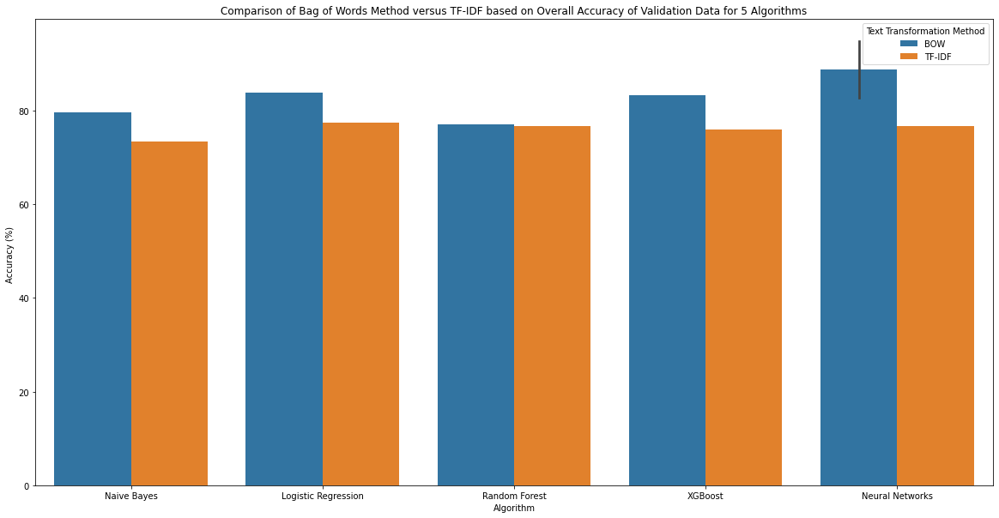

In [252]:
plt.figure(figsize=(20,10))
sns.barplot(data=validation,x='Algorithm',y='Accuracy (%) ',hue='Text Transformation Method')
plt.title('Comparison of Bag of Words Method versus TF-IDF based on Overall Accuracy of Validation Data for 5 Algorithms')

In [484]:
#performance_evaluation={'Algorithm':['Naive Bayes','Naive Bayes','Logistic Regression','Logistic Regression','Random Forest','Random Forest','XGBoost','XGBoost','Neural Networks','Neural Networks',
#                                     'Naive Bayes','Naive Bayes','Logistic Regression','Logistic Regression','Random Forest','Random Forest','XGBoost','XGBoost','Neural Networks','Neural Networks'],
#             'Accuracy (%) ':[82,81,87,85,78,78,87,84,88,84,83,68,87,73,78,77,88,74,96,78],
#            'Recall (0-1)':[0.72,0.70,0.73,0.67,0.12,0.10,0.65,0.59,0.68,0.65,0.49,0.48,0.72,0.32,0.14,0.04,0.68,0.15,0.5,0.47],
#            'Type of Dataset':['Training Set','Validatoin Set','Training Set','Validatoin Set','Training Set','Validatoin Set','Training Set','Validatoin Set',
#                               'Training Set','Validatoin Set','Training Set','Validatoin Set','Training Set','Validatoin Set','Training Set','Validatoin Set',
#                               'Training Set','Validatoin Set','Training Set','Validatoin Set'],                     
#            'Text Transformation Method':['Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','Bag of Words','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF','TF-IDF']
#            }

In [267]:
performance_df

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
1,Naive Bayes,79.53,0.68,Validation Set,BOW
2,Logistic Regression,86.22,0.7,Training Set,BOW
3,Logistic Regression,83.75,0.64,Validation Set,BOW
4,Random Forest,77.48,0.08,Training Set,BOW
5,Random Forest,77.1,0.05,Validation Set,BOW
6,XGBoost,85.97,0.63,Training Set,BOW
7,XGBoost,83.26,0.56,Validation Set,BOW
8,Neural Networks,94.8,0.89,Training Set,BOW
9,Neural Networks,94.8,0.89,Training Set,BOW


In [259]:
performance_df.loc[9,'Type of Dataset']='Training Set'
performance_df.loc[10,'Type of Dataset']='Validation Set'

In [268]:
performance_df.drop([9],inplace=True)

RangeIndex(start=0, stop=21, step=1)

In [271]:
performance_df

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
1,Naive Bayes,79.53,0.68,Validation Set,BOW
2,Logistic Regression,86.22,0.7,Training Set,BOW
3,Logistic Regression,83.75,0.64,Validation Set,BOW
4,Random Forest,77.48,0.08,Training Set,BOW
5,Random Forest,77.1,0.05,Validation Set,BOW
6,XGBoost,85.97,0.63,Training Set,BOW
7,XGBoost,83.26,0.56,Validation Set,BOW
8,Neural Networks,94.8,0.89,Training Set,BOW
10,Neural Networks,82.73,0.62,Validation Set,BOW


In [486]:
performance.columns

Index(['Algorithm', 'Accuracy (%) ', 'Recall (0-1)', 'Type of Dataset',
       'Text Transformation Method'],
      dtype='object')

In [380]:
#validation_set_performance=performance[performance['Type of Dataset']=='Validatoin Set']

In [250]:
#validation_set_performance.dtypes

In [272]:
BOW_performance=performance_df[performance_df['Text Transformation Method']=='BOW']
plt.figure(figsize=(20,10))
fig=px.bar(BOW_performance,x='Algorithm',y='Accuracy (%) ',color='Type of Dataset',barmode='group',title='Training and Validation Set Accuracy for Bag of Words Method')

fig.show()

<Figure size 1440x720 with 0 Axes>

In [486]:
#TF_IDF_performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
10,Naive Bayes,83,0.49,Training Set,TF-IDF
11,Naive Bayes,68,0.48,Validatoin Set,TF-IDF
12,Logistic Regression,87,0.72,Training Set,TF-IDF
13,Logistic Regression,73,0.32,Validatoin Set,TF-IDF
14,Random Forest,78,0.14,Training Set,TF-IDF
15,Random Forest,77,0.04,Validatoin Set,TF-IDF
16,XGBoost,88,0.68,Training Set,TF-IDF
17,XGBoost,74,0.15,Validatoin Set,TF-IDF
18,Neural Networks,96,0.50,Training Set,TF-IDF
19,Neural Networks,78,0.47,Validatoin Set,TF-IDF


In [273]:
TF_IDF_performance=performance_df[performance_df['Text Transformation Method']=='TF-IDF']
plt.figure(figsize=(20,10))
fig=px.bar(TF_IDF_performance,x='Algorithm',y='Accuracy (%) ',color='Type of Dataset',barmode='group',title='Training and Validation Set Accuracy using TF-IDF Method')
fig.show()
#plt.ylim([0,100])

<Figure size 1440x720 with 0 Axes>

In [274]:
BOW_performance

,Algorithm,Accuracy (%),Recall (0-1),Type of Dataset,Text Transformation Method
0,Naive Bayes,80.67,0.7,Training Set,BOW
1,Naive Bayes,79.53,0.68,Validation Set,BOW
2,Logistic Regression,86.22,0.7,Training Set,BOW
3,Logistic Regression,83.75,0.64,Validation Set,BOW
4,Random Forest,77.48,0.08,Training Set,BOW
5,Random Forest,77.1,0.05,Validation Set,BOW
6,XGBoost,85.97,0.63,Training Set,BOW
7,XGBoost,83.26,0.56,Validation Set,BOW
8,Neural Networks,94.8,0.89,Training Set,BOW
10,Neural Networks,82.73,0.62,Validation Set,BOW


In [275]:
plt.figure(figsize=(20,10))
fig=px.bar(BOW_performance,x='Algorithm',y='Recall (0-1)',color='Type of Dataset',barmode='group',title='Training and Validation Set Recall using Bag of Words Method')
fig.show()

<Figure size 1440x720 with 0 Axes>

In [276]:
time_complexity['Neural Networks']=210
time_complexity

{'Naive Bayes': 0.07,
 'Logistic Regression': 6.65,
 'Random Forest': 16.6,
 'XGBoost': 12.2,
 'Neural Networks': 210}

In [278]:
time_complexity_bow_df=pd.DataFrame([time_complexity],index=['Time (sec)']).T.reset_index()
time_complexity_bow_df.rename(columns={'index':'Algorithm'},inplace=True)

In [279]:
time_complexity_bow_df.dtypes

Algorithm      object
Time (sec)    float64
dtype: object

In [280]:
plt.figure(figsize=(8,5))
px.bar(time_complexity_bow_df,x='Algorithm',y='Time (sec)',text='Time (sec)',title='Training Time Complexity')


<Figure size 576x360 with 0 Axes>

In [ ]:
### One Versus All Objective: To achieve atleast 80% recall

In [427]:
selected_model_performance['Threshold']

[0.2, 0.2, 0.2, 0.2]

In [283]:
selected_model_performance={'Algorithm':['Naive Bayes','Naive Bayes','Logistic Regression','Logistic Regression'],
                           'Threshold':[0.1,0.1,0.2,0.2],
                           'Recall (%)':[85,85,85,80],
                           'Accuracy (%)':[84,83,91,91],
                            'Type of Dataset':['Training Data','Validation Data','Training Data','Validation Data']
                           }

In [284]:
pd.DataFrame(selected_model_performance)

,Algorithm,Threshold,Recall (%),Accuracy (%),Type of Dataset
0,Naive Bayes,0.1,85,84,Training Data
1,Naive Bayes,0.1,85,83,Validation Data
2,Logistic Regression,0.2,85,91,Training Data
3,Logistic Regression,0.2,80,91,Validation Data


In [286]:
plt.figure(figsize=(20,10))
fig=px.bar(selected_model_performance,x='Algorithm',y='Accuracy (%)',barmode='group',color='Type of Dataset',title='Training and Validation Set Recall using Bag of Words Method')
fig.show()

<Figure size 1440x720 with 0 Axes>

- Recall of 0.1 for Naive Bayes is too less, and for threshold 0.2, Logistic Regression is performing better with an Accuracy of 91 % and Recall of 85%

In [285]:
plt.figure(figsize=(20,10))
fig=px.bar(selected_model_performance,x='Algorithm',y='Recall (%)',barmode='group',color='Type of Dataset',title='Training and Validation Set Recall using Bag of Words Method')
fig.show()

<Figure size 1440x720 with 0 Axes>